In [10]:
import sys
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)

[('spotcalls', 1961182022),
 ('DBSCAN', 1464),
 ('KDTree', 1184),
 ('purge_zoverlap', 136),
 ('np', 80)]

In [24]:
from fish_results import *
subset = ['Pos54','Pos62','Pos10','Pos122','Pos246','Pos25','Pos250','Pos223']
print(subset)
cstk_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/'
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in subset]
nfs = []
weights = []
for hdata in hybedatas:
    pos = hdata.posname
    for z in hdata.metadata.zindex.unique():
        nf = hdata.load_data(pos, z, 'nf')
        weight = hdata.load_data(pos, z, 'weights')
        weights.append(weight)
        nf = nf*weight
        nfs.append(nf)
nfs = np.nansum(nfs,axis=0)
weights = np.nansum(weights,axis=0)
cur_nf = nfs/weights

['Pos54', 'Pos62', 'Pos10', 'Pos122', 'Pos246', 'Pos25', 'Pos250', 'Pos223']


In [25]:
cur_nf

array([ 777.01232504,  745.79104902,  398.13640341,  550.30584865,
        629.75883153,  558.88153535,  555.84108137,  583.84631018,
        688.25522403,  615.56824583,  994.95536813, 1026.00610032,
        560.58831992,  489.78347515,  723.69165877, 1481.26820123,
       1087.22907904, 1541.23000553])

In [1]:
from fish_results import *
hdata = HybeData('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/Pos1')
pos = hdata.posname
zindxes = hdata.metadata.zindex.unique()
z = zindxes[10]
nf = hdata.load_data(pos, z, 'nf')
cimg = hdata.load_data(pos, z, 'cimg')
weight = len(cimg[cimg>-1])

In [16]:
from analysis_scripts.iterative_classify_codestacks import *
hdata = HybeData('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/Pos1')
nfactor = nf
nvectors = seqfish_config.norm_gene_codeword_vectors
classify_file(hdata, nfactor, nvectors, genesubset=None, thresh=500, csphere_radius=0.5176)

Pos1


KeyboardInterrupt: 

In [20]:
cimg

array([[-1, -1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1, -1, -1],
       ...,
       [-1, -1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1, -1, -1]], dtype=int16)

In [13]:
import importlib
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
normalized_gene_vectors = seqfish_config.norm_gene_codeword_vectors


In [22]:
def nf_weights(class_img,cvectors):
    weights = np.zeros(cvectors.shape[1])
    for bit in range(cvectors.shape[1]):
        spotsum = 0
        for gene in range(cvectors.shape[0]):
            if cvectors[gene,bit]>0:
                spotsum = spotsum + len(cimg[cimg==gene])
        weights[bit]=spotsum
    return(weights)
weights = nf_weights(cimg,normalized_gene_vectors)

In [23]:
weights

array([4.676e+03, 4.123e+03, 2.610e+02, 4.190e+02, 3.590e+03, 3.879e+03,
       1.032e+03, 1.087e+03, 1.525e+03, 1.361e+03, 7.115e+03, 2.835e+03,
       2.000e+00, 1.100e+01, 1.800e+01, 1.050e+03, 1.578e+03, 3.206e+03])

In [15]:
nf

array([1751.15441895, 1663.23657227,  420.78262329,  587.95782471,
       1355.72277832, 1625.93444824, 1511.99462891, 1647.21228027,
       1449.98205566, 1372.84240723, 2021.6706543 , 1796.87255859,
        643.7822876 ,  619.77227783,  722.8135376 , 1947.18322754,
       1525.42346191, 2322.48510742])

In [27]:
weight_ori = weights

In [28]:
nfs = []
weights = []
for i in range(50):
    nf = nf_ori
    weight = weight_ori
    weight[np.isnan(weight)]=0
    weights.append(weight)
    nf[np.isnan(nf)]=0
    nf = nf*weight
    nfs.append(nf)
    

In [33]:
Weight = np.sum(weights,axis=0)
NF = np.sum(nfs,axis=0)

In [1]:
from analysis_scripts.iterative_classify_codestacks import *
def egalitarian_mean_one_bits(cstk, class_img, cvectors, spot_thresh=10**2.55,mean_min_spot_thresh = 485):
    cstk = cstk.astype('float32')
    nf = np.zeros(cvectors.shape[1])
    for bit in range(cvectors.shape[1]):
        spots_intensity = []
        for gene in range(cvectors.shape[0]):
            if cvectors[gene,bit]>0:
                x, y = np.where(class_img==gene)
                if len(x) == 0:
                    continue
                intensities = cstk[x, y, bit]
                print(intensities)
                spots_intensity.append(intensities[intensities>spot_thresh])
        nf[bit]=np.mean(np.concatenate(spots_intensity).ravel())
    return nf
import importlib
from fish_results import *
hdata = HybeData('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/Pos1')
pos = hdata.posname
z = hdata.metadata.zindex.unique()[10]
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
cvectors = seqfish_config.norm_gene_codeword_vectors
nfactor = hdata.load_data(pos, z, 'nf')
cstk = hdata.load_data(pos, z, 'cstk')
class_img = classify_codestack(cstk, nfactor, seqfish_config.norm_gene_codeword_vectors, csphere_radius=0.5176)
out = egalitarian_mean_one_bits(cstk, class_img, cvectors, spot_thresh=10**2.55,mean_min_spot_thresh = 485)

[516. 801.]
[ 834. 1324.  823. 1526.]
[1304.]
[2669.  603.]
[742. 401. 229.]
[ 904.  988. 1341.  854.  716. 1180.]
[ 975. 1157. 1476. 1529. 1796. 1025.  988.  819.  699. 1687. 1080. 1149.
 1491. 1002. 1718.  734.  803.  673.  615. 1162. 2153.  981. 1501. 1354.
 2478. 1909. 1044. 1137.  939. 1386. 1873.  988. 1332. 1523. 2135. 1269.
  989. 1299. 1574. 1641. 2112. 2082. 1548. 1044. 2063. 1108. 1034. 1072.
 2118. 1655. 1041. 2085. 1056. 1855. 2016. 1188. 1886.  891. 1120. 1003.
 1255.  700.  953. 1230. 1893. 1955. 1430. 2304. 2458.  739.  988. 1084.
 1518. 1499. 1384. 1354. 1119. 1795.  836. 2141. 2556. 1282. 1217. 1699.
 1242. 1758. 1034. 1555. 1484. 2118. 2071. 1454. 1464. 1317. 1193. 1539.
 1387. 1205. 1412. 1694.  749. 1356. 1869. 1748. 2322. 1372. 2099. 1082.
 1369. 1886. 1753. 2270. 1867.]
[2190. 1653. 1378.]
[3468. 4709. 3156. 2112.]
[1173. 1242. 1097.  983.  829. 1128. 1948. 1004. 1450.  629.  896.  763.
  694.  895.  860. 1065.  888.  751. 1242. 1070. 1227.  656. 1144. 2264.
 100

ValueError: operands could not be broadcast together with shapes (2,) (4,) 

In [17]:
np.nan

nan

In [2]:
np.unique(class_img)

array([ -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
        12,  13,  14,  15,  16,  17,  18,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  35,  36,  37,  38,  39,
        40,  41,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,
        54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  67,
        68,  69,  70,  71,  72,  73,  75,  76,  77,  78,  79,  81,  82,
        83,  84,  85,  86,  87,  88,  90,  92,  93,  94,  95,  96,  97,
        98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 111,
       112, 113, 114, 115, 117, 118, 119, 120, 121, 122, 123, 124, 125,
       126, 128, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142,
       143, 144, 145, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 160, 161, 162, 166, 167, 168, 170], dtype=int16)

In [3]:
class_img

array([[-1, -1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1, -1, -1],
       ...,
       [-1, -1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1, -1, -1]], dtype=int16)

In [9]:
np.mean(np.concatenate(spots_intensity).ravel())

1751.1544

In [10]:
cvectors = seqfish_config.norm_gene_codeword_vectors
spot_thresh=10**2.55
cstk = cstk.astype('float32')
nf = np.zeros(cvectors.shape[1])
for bit in range(cvectors.shape[1]):
    spots_intensity = []
    for gene in range(cvectors.shape[0]):
        if cvectors[gene,bit]>0:
            x, y = np.where(class_img==gene)
            if len(x) == 0:
                continue
            intensities = cstk[x, y, bit]
            spots_intensity.append(intensities[intensities>spot_thresh])
    nf[bit]=np.mean(np.concatenate(spots_intensity).ravel())

[516. 801.]
[ 834. 1324.  823. 1526.]
[1304.]
[2669.  603.]
[742. 401. 229.]
[ 904.  988. 1341.  854.  716. 1180.]
[ 975. 1157. 1476. 1529. 1796. 1025.  988.  819.  699. 1687. 1080. 1149.
 1491. 1002. 1718.  734.  803.  673.  615. 1162. 2153.  981. 1501. 1354.
 2478. 1909. 1044. 1137.  939. 1386. 1873.  988. 1332. 1523. 2135. 1269.
  989. 1299. 1574. 1641. 2112. 2082. 1548. 1044. 2063. 1108. 1034. 1072.
 2118. 1655. 1041. 2085. 1056. 1855. 2016. 1188. 1886.  891. 1120. 1003.
 1255.  700.  953. 1230. 1893. 1955. 1430. 2304. 2458.  739.  988. 1084.
 1518. 1499. 1384. 1354. 1119. 1795.  836. 2141. 2556. 1282. 1217. 1699.
 1242. 1758. 1034. 1555. 1484. 2118. 2071. 1454. 1464. 1317. 1193. 1539.
 1387. 1205. 1412. 1694.  749. 1356. 1869. 1748. 2322. 1372. 2099. 1082.
 1369. 1886. 1753. 2270. 1867.]
[2190. 1653. 1378.]
[3468. 4709. 3156. 2112.]
[1173. 1242. 1097.  983.  829. 1128. 1948. 1004. 1450.  629.  896.  763.
  694.  895.  860. 1065.  888.  751. 1242. 1070. 1227.  656. 1144. 2264.
 100

[1706.]
[ 497. 1838. 1208.  807.]
[ 841.  724.  938.  723.  881.  649.  757.  793. 1573. 1223. 1508. 1024.
 1082. 1814. 1805. 1936. 1187. 1328.  949. 2074. 1279. 1549. 1426. 1752.
 1026. 2105. 2643. 2023. 1019. 1308. 1043. 1229. 1767. 1713. 1873. 1242.
 1305.  950.  942.  925. 1405. 1440. 1018. 1396. 1762. 1570. 1312. 1569.
 1928. 1290. 2323. 2475. 1767. 2098. 2333. 1773. 1449. 1624. 1491. 1810.
 1350. 1240. 1470. 1762. 1335.  974. 1605. 1960. 1503. 1210.  861. 1014.
  734. 2259. 2673. 1102. 1993. 2084. 1111. 1746. 1795.  924. 1129.  603.
  572.  485. 1627. 1943.  482.  673. 1071.  673.  809. 1139.  963.  732.
  944. 1028. 1426. 1030. 1593. 1047. 1148. 1037. 1450. 1396. 1806. 1747.
  956. 1407.  766. 1308. 1734. 1518. 1229. 1541. 1445. 1084. 1006. 1680.
 1391. 1567. 1146.  932.  948.  750. 1015. 1170. 1163.  688.  718. 1165.
  852. 1088. 1266. 1073.  729. 1211. 1256. 1342. 2004. 2231.  677. 1575.
  563. 1018. 1290. 1748. 1215. 1603.  824. 1221.  836. 1204. 1077. 1169.
 1000.  736.  697

[321.]
[546. 465.]
[1128. 1757. 2450. 2709.]
[ 876. 1004. 1402. 1890.  980. 1172. 1175. 1328. 1447. 1374.  796.  862.
  825.  839. 1616. 1267. 2782.]
[559. 680.]
[2334.  621.  687. 1761. 1177. 1256.]
[ 466. 1184.]
[1157.]
[421. 424. 535. 756.]
[ 920. 1075.  889.  797. 1067.  951.  754.  940.  687.  610. 1111. 1356.
 1032. 1318.  695.  695. 1006. 1195.  796. 1366. 1359. 1069. 1121. 1146.
 1119.  918. 1383. 1643. 1406. 1068. 1419. 1059.  864.  720.  522. 1336.
 1439.  922.]
[1028. 1528. 1403.  869. 1364. 1739.  585.  573.]
[607. 736. 800.]
[1355. 1506. 1141.]
[1477. 1756.  959. 1155. 1734. 1601. 1492.  957.  632.  615.  455.]
[641. 341. 672. 408.]
[627. 647.]
[ 785.  590.  828.  827.  835.  939.  973.  490. 1177.  754. 1132. 1203.]
[1262. 1274. 1122.  755.  765. 1053. 1259. 1160. 1208. 1062.  977. 1016.
 1314.  820.  632. 2279. 1372. 1033. 1018. 1074. 1508. 1535.  953. 1386.
 1479. 1372. 1808. 1586. 2141. 1892. 1526. 1272.  877. 1116.  966. 1104.
 1053. 1010. 1252. 1188. 1088. 1287.  386

[ 568. 1251. 1076.]
[1644. 1184. 1618. 1233. 1420. 1192. 1938.  983. 1264. 1470.  668.]
[469. 993.]
[ 919. 1223. 1490.]
[1046. 1496. 1331.]
[1410.  734.]
[1102. 1201. 1502. 2612. 1544. 2336. 1058. 1359.  540.  927. 2367. 1869.
 2105. 1275. 1313. 1355. 1251.  552.]
[1216. 1261. 1061.  878. 1080. 1457. 1235. 1449. 1969.  595. 1950. 1829.
 1571. 1316. 1474.  827.  948. 1028. 1424. 1249.  848. 1128. 1557. 1870.
 1516. 1875. 1456.  745. 1285. 1374. 2657. 3249. 2485. 1189. 2776. 3376.
 2571. 2417. 1384. 1697.  716. 2752. 3334. 2403. 2943. 2295. 1526. 1185.
 2315. 3569. 2642. 4047. 1455. 1073.  598.  724.  536.  934.  954.  869.
 1113. 1421.  813. 1977. 1230.  703. 1316.  765. 1433.  464.]
[934. 996. 491.]
[1303. 2253. 1204. 1229. 1130. 1104.  812.]
[1295.  846. 1084.]
[505. 717.]
[1634. 2043. 1600. 1213.  809.]
[516. 667. 561. 614. 485.]
[538. 617.]
[1986.  723. 1343. 2153. 1589. 2047.  890.  775.]
[1223. 1394.  917. 1107.]
[1006. 1127. 1457.  781.  663.  652. 1242. 1137. 1794. 1490.  736. 1

[1195. 1381. 1019. 1116. 1435. 1907. 1172. 1125. 1005. 1600. 1632. 1301.
 1783.  924. 1373. 1422. 1145.  877. 1929. 1053.  575. 1730.  890.  650.
 1751. 1248. 1379.  691. 1116.  723. 1434. 1142. 2198.  870. 1152.  763.
 1006.  919.]
[ 997. 1396. 1149.]
[3005. 3468. 3179. 2618.  881. 1550. 2912. 1611. 2534. 1367. 1026.  870.
 1686.  993. 1671. 1598.]
[ 803.  831.  936. 1344. 1408.  874.]
[1688. 1310. 1267. 3222. 2865. 1964. 1704. 2261. 1967. 1850. 1413. 1538.
 1052. 3164. 1363. 1554. 2505. 1823. 1502.  913. 2178. 2573.  899. 2332.
 2323. 2243. 2598. 1897. 2129. 1408. 2584. 2673. 1754. 1304. 1675. 1218.
 2968. 1241. 2046. 2433. 1315. 2611. 2232. 2369.  648. 2273. 1881. 1497.
 2371. 1784. 2182. 2486. 2528.]
[971.]
[1350.]
[ 531. 1383.]
[1812.]
[2234. 2682.  849.]
[1777.  797. 1121.  837. 1147. 1048.  794.  731.  863. 1096. 1198.  855.
 1321. 1444. 1031.  978.  825.  901.  727.  720. 1448. 1132. 1047.  943.
  938.  726.  648. 1026.  782.  769. 1056.  821. 1087.  891.  881.  908.
  734.  87

[584. 487. 845. 747.]
[ 902.  593. 2152.  699.  468.  630. 1320. 1375.  990. 1182.  847. 1749.
 1658. 2241.]
[754.]
[1899.  785. 1001.  982. 1518. 1811. 1145. 1288.  838. 2134. 1596. 1321.
 2117. 1694. 1156. 1863. 1153. 2129. 3031. 2808. 2213. 3785. 3508.  861.
 1597. 1417. 2478. 3134. 1500. 1263.  671. 1108. 1084. 1118. 1249. 1115.
 1094. 1277. 1445. 1382. 1646.  873. 1097. 1040.  787. 1231. 1070. 1714.
 1919. 1539. 1141.  849. 1527. 1258. 1286. 1489. 1731. 1293. 1414. 1762.
 2552. 2017. 1676. 1091.  630.  717.  632.  857. 1256. 1035. 1432. 1474.
 1703.  672.  448.  955. 1093. 2234. 2417. 1644. 2862. 1686. 3242. 3283.
 1999. 1123. 1623. 1393. 2074. 2036. 1044. 1564. 2040. 1641. 3582. 2929.
  588. 1240. 1611. 1072. 1285.  811.  685. 2248. 1494. 1509. 1432. 1711.
 1276. 1707. 2302. 1496. 1577.  900. 1516. 1213. 1966. 1324.  502. 1699.
  949. 3512. 1990. 4400. 2531. 1984. 1371. 2520. 2128. 1081. 2582. 2091.
 1001. 2199. 2380. 1179. 1188.  953. 1191. 1632. 1336.  988. 1424. 1254.
 1473.  

[1195. 1247. 1322. 3193. 2057. 4257. 2794. 4369. 5265. 3975. 2204. 2773.
 2201. 1962. 1655. 1043. 1120. 1807. 2069. 1447. 1781.  823. 1452. 1854.
 2109. 1211. 1097. 1048.  941. 2818. 1640. 1186. 1492. 2095. 2139. 3265.
 3887. 3204. 2614. 1419. 2113. 1921. 1788. 1259. 1476. 1984. 1570. 2667.
 3320. 2077. 1779. 1206.  971. 2623. 2468. 3338. 1930. 1093. 1149. 2156.
 1892. 1453. 2026. 2382. 1787. 1991. 1131. 1752. 2152. 3044. 3895. 3803.
 2182. 2737. 2788. 2724. 1566. 2055. 2818. 2257. 1230. 2743. 1474.  958.
 1640. 2642. 1595. 1886. 1635. 6924. 3839. 4803. 4567. 2530. 1407. 1337.
 2043. 2734. 1117. 1322. 2965. 2055. 1838. 1211. 1425. 1489. 2969. 2926.
 2258. 2731. 1227. 2010. 2428. 2243. 1913.  859. 4139. 3164. 4285. 3611.
 2499. 2113. 3080. 3030. 1270. 2103. 2054.  847. 1545. 1837. 2097. 2531.
 3922. 3678. 1286. 2320. 2719. 2025. 2373. 3616. 1717. 2107. 1632. 4350.
 3469. 2272. 3605. 2677. 2474. 1835. 1423.  751. 2131. 2169. 2126. 1527.
 1943. 1776. 3127. 2968. 1659. 2605. 1502.  856. 54

[2077. 1262. 1445. 1377.  820.  791.  712. 1229. 2127.]
[2854. 2548. 1237. 1091.  736.  614.]
[1529. 1022. 1132. 1392. 1264.]
[2622.  779.  851.  724.  831. 1288. 2138. 1956. 1182. 1297. 1844.  921.
  847.  908. 1413. 1560. 1472.  852. 1267. 1059. 1749. 2567. 2101. 2227.
 3200. 2590. 2555. 2367. 1187.  900. 1010. 1574.  379. 1321. 1794. 1509.
 2205. 1845. 2595. 2407. 2280.  727.]
[2378. 1498.  671. 1011. 1305.]
[971. 969.]
[1356.  951. 1453. 1999. 2164. 1026. 1274.  884. 1467. 1205. 1962. 1805.
  895. 1243. 1284. 1201. 1909. 1650. 1852.  942. 1986. 3791. 4718. 3577.
 2227. 2247. 1993.]
[1001. 1144. 1989. 2179. 1323. 1721. 2236. 1934. 1803. 2266. 1897. 2307.
 2174. 2027. 1907. 1083. 1020. 1546. 1345. 1365. 1660.  982. 1219.  979.
  751. 1801. 2741. 2644. 1881. 2879. 2808. 1859. 2415. 1302.  750. 1319.
 1512.  564.  958. 1149. 1413. 1299. 2024. 1816. 1747. 3106. 1669. 2347.
 1347. 1025. 1189. 1053. 1101. 2299. 2117. 2716. 2462. 2174. 2424. 3666.
 2930. 3663. 2664. 1592. 1698. 1985. 1736.

[ 528. 1127.  862.]
[1683.  911.]
[2324. 2005. 2525. 2462. 1626. 1573. 2070. 2181. 2804. 1256. 1373. 1652.
 1953. 1073. 1176. 2240. 2162. 1738. 1691. 1555. 2467. 2369. 1433. 2209.
 2080. 1142. 2079.  882. 1606. 1675.  704. 1316. 1134. 1178. 1012. 1620.
 1183. 1514. 1547. 1004. 2107. 2095.  641.  733. 1107.]
[ 840.  644. 1351. 1247. 2413. 2375. 2078. 2002. 3809.  615. 2225. 1414.
 1697. 1762. 2107. 1559. 1830. 2278. 2893. 2197. 1886. 2435. 1856. 2410.
 3381. 4999. 4111. 1401. 1257. 1667. 4432. 6501. 5303. 1890. 3144. 4582.
 3716. 2744. 3358. 3237. 1719. 2708. 3533. 2015. 2834. 2422. 1408. 1622.
 2317. 3309. 1880. 2661. 1657. 1525. 1540. 2401. 2229. 1865. 1359.  819.
 1595. 2814. 1623. 2394. 2527. 1010. 1672.  970. 1703. 1487.]
[1077.]
[1582. 1235.]
[1183.]
[ 910. 1060. 1653. 2004. 1049. 1151. 2603.  986. 1637. 2322. 2654. 1289.
 1311. 1102. 1725. 1510. 1202. 1390. 1906. 2237. 2200. 1553. 1364. 2867.
 1165. 1350. 1299. 1626. 1889.  798. 2507. 2232. 1698. 1668. 2414. 3468.
 1407. 1713.  9

[1434.]
[492.]
[1065.]
[536. 936.]
[2026. 1669. 1044. 2052. 1547. 2188. 1476. 1808.  448.  560. 1056. 2135.
 1720. 1660. 1260. 1036. 1244. 1031. 1251.  900. 1262.  929.  990. 1294.
 1131. 1126.  760. 1283. 1008.  961. 1008. 1053. 1927. 2088. 1511. 1602.
 1426. 1611. 1087. 1100. 1280. 1178. 1081. 1322. 1230.  908. 1267. 1541.
 2165. 2198. 1550. 1042. 1433. 1003. 1327. 1675. 1009. 2175. 2545. 1197.
 1121. 1001.  861.  680. 2139. 1723. 1586. 1637. 2040. 1155. 1372.  974.
 2272. 1425. 2315. 1437. 2165. 2432. 2108. 2249.]
[1108.  765.  507.  602.  456.  942. 1682. 1337.  947. 1502. 1379. 1123.
  772. 2198. 1482.]
[1960. 1517. 2404.]
[ 681.  692. 1120. 1109.  477. 1223.  744.]
[1454. 1251. 1686.  600. 1706. 1655.]
[1265.  978. 1421. 2163. 1386. 1222.  813. 1829. 1263.  950.]
[ 559. 1351. 1181.]
[1453. 2163. 1136. 1647. 1714.]
[953.]
[1304. 1302. 1081.]
[2236. 3495. 3093. 3754.]
[1370. 1535.  994. 1418. 2215. 1816. 2461. 2296. 1799. 1729. 1911. 1910.]
[2268. 2156. 1939. 2387. 2489. 2105. 1554

[1181. 1522. 1553. 2122. 1693. 2804. 3813. 3013. 4185. 3271.  863. 1493.
 1711.  985. 1716. 1976.  995. 3804. 1936. 4248. 3583. 1820.  583. 1998.
 1017.  957. 1325. 1208. 2022. 2580. 2192. 1145. 1820. 1187. 1038. 1341.
 1939. 1892. 1456. 2148. 2128.  889. 1005. 2121. 2402. 1642. 3078. 3488.
 2394. 3076.  773.  397. 1637. 1302.  687. 1413. 1554. 2087. 2442. 3160.
 1268. 1220. 1754. 1358. 1769. 2610. 1931. 3442. 2521. 1138. 1882.  969.
 1850. 1972. 2109. 4029. 2788. 3104. 2043. 1394. 1619. 2334. 2122. 2531.
 2431. 1953. 1513. 2383. 1775. 2659. 3224. 3922. 4782. 1241. 1208.  773.
 1851. 2756. 1585. 2350. 1073. 1261.  935. 1340. 1552. 1125. 1843. 3441.
 3238. 1973. 5094. 5287. 3411. 1337. 5276. 3566. 1464. 1134.  795. 3370.
 2102. 1908. 1783. 1668. 1128. 1695. 1898. 1708. 2503. 1528. 2436. 1827.
 2263. 3205. 1624. 1450.  722. 1183. 1603. 1867. 2023. 1081. 1295. 1695.
 1900. 2275. 2411. 1667. 1861. 1872. 1206. 1392. 1435. 2983. 3723. 2502.
 4769. 3216. 1199. 2210. 2945.  957. 2377. 1774. 29

In [11]:
nf

array([1751.15441895, 1663.23657227,  420.78262329,  587.95782471,
       1355.72277832, 1625.93444824, 1511.99462891, 1647.21228027,
       1449.98205566, 1372.84240723, 2021.6706543 , 1796.87255859,
        643.7822876 ,  619.77227783,  722.8135376 , 1947.18322754,
       1525.42346191, 2322.48510742])

In [12]:
old_nf = mean_one_bits(cstk, class_img, cvectors, spot_thresh=10**2.55,mean_min_spot_thresh = 485)

In [13]:
old_nf

array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan])

In [11]:
np.unique(class_img)

array([-1], dtype=int16)

In [44]:
hdata.load_data(pos, z, 'nf')

array([675.        , 667.1255127 , 320.        , 378.87828064,
       571.        , 630.45024414, 552.6240387 , 658.        ,
       617.02693176, 577.        , 782.        , 715.9688446 ,
       390.01657867, 379.74101868, 425.        , 685.79858093,
       581.        , 837.4428772 ])

In [38]:
nf_ori

array([ 939.97021484, 1239.94750977,  501.33334351,  573.39855957,
        743.79980469,  941.49365234, 1111.57019043, 1246.10266113,
       1199.515625  , 1001.35931396, 1036.63818359, 1254.12121582,
        981.5       ,  756.48150635,  957.31665039, 1903.18054199,
       1065.84204102, 1800.26782227])

In [36]:
NF/Weight

array([ 939.97021484, 1239.94750977,  501.33334351,  573.39855957,
        743.79980469,  941.49365234, 1111.57019043, 1246.10266113,
       1199.515625  , 1001.35931396, 1036.63818359, 1254.12121582,
        981.5       ,  756.48150635,  957.31665039, 1903.18054199,
       1065.84204102, 1800.26782227])

In [5]:
import numpy as np
from sklearn.cluster import DBSCAN
from scipy.spatial import KDTree
def purge_zoverlap(df):
    for pos in df.posname.unique():
        zidxes = df.z.unique()
        print('position', pos)
        for z_i in range(len(zidxes)-1):
#             print('zindex',zidxes[z_i]
            try:
                subdf = df[(df.posname==pos) & ((df.z==zidxes[z_i]) | (df.z==zidxes[z_i+1]))]
                yx = subdf.centroid.values
                yx = np.stack(yx, axis=0)
                tree = KDTree(yx)
                dclust = DBSCAN(eps=2, min_samples=2)
                dclust.fit(yx)
                skip_list = set(np.where(dclust.labels_==-1)[0])
                nomatches = []
                drop_list = []
                for idx, i in enumerate(yx):
    #                 if idx % 10000 == 0 and idx != 0:
    #                     print(idx)
                    if idx in skip_list:
                        continue
                    m = tree.query_ball_point(i, 2)
                    m = [j for j in m if j!=idx]

                    row_query = subdf.iloc[idx]
                    for j in m:
                        row_match = subdf.iloc[j]
                        if row_match.cword_idx!=row_query.cword_idx:
                            continue

                        if row_match.npixels>=row_query.npixels:
                            drop_list.append((idx, j))
                        else:
                            drop_list.append((j, idx))
                            break
                if len(drop_list)>0:
                    droppers, keepers = zip(*drop_list)
                    df.drop(index=subdf.iloc[list(droppers)].index,inplace=True)
            except:
                print(pos)
                print(zidxes[z_i])
                print('check this one out')
                continue
#             print(len(drop_list),' spots purged')
    return df

In [7]:
import pickle
import os
spotcalls = pickle.load(open('/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/results/spotcalls.pkl','rb'))
spotcalls = spotcalls.drop(columns='coords')
spotcalls = spotcalls.drop(columns='pixel_values')
cstk_path = '/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/results'
pickle.dump(spotcalls,open(os.path.join(cstk_path,'spotcalls_reduced_size.pkl'),'wb'))

In [2]:
import pickle
import os
spotcalls = pickle.load(open('/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_Third_2018Dec20/results/spotcalls_reduced_size.pkl','rb'))
print('Dataframe Loaded')
spotcalls = purge_zoverlap(spotcalls)
cstk_path = '/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_Third_2018Dec20/results'
pickle.dump(spotcalls,open(os.path.join(cstk_path,'spotcalls_pos_purged.pkl'),'wb'))


Dataframe Loaded
position Pos122
position Pos13
position Pos31
position Pos53
position Pos105
position Pos110
position Pos82
position Pos37
position Pos102
position Pos77
position Pos27
position Pos116
position Pos96
position Pos76
position Pos17
position Pos58
position Pos71
position Pos14
position Pos6
position Pos93
position Pos22
position Pos65
position Pos9
position Pos41
position Pos55
position Pos29
position Pos85
position Pos99
position Pos47
position Pos91
position Pos3
position Pos75
position Pos117
position Pos103
position Pos107
position Pos60
position Pos67


In [ ]:
import pickle
import os
import datetime
start = datetime.datetime.now()
spotcalls = pickle.load(open('/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/results/spotcalls_reduced_size.pkl','rb'))
print('Dataframe Loaded')
spotcalls = purge_zoverlap(spotcalls)
cstk_path = '/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/results'
pickle.dump(spotcalls,open(os.path.join(cstk_path,'spotcalls_pos_purged.pkl'),'wb'))
end = datetime.datetime.now()
print('Started ',start)
print('Ended ', end)

Dataframe Loaded
position 3-Pos_002_002


In [7]:
import pickle
old = pickle.load(open('/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/results/spotcalls_reduced_size.pkl','rb'))
new = pickle.load(open('/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/results/spotcalls_pos_purged.pkl','rb'))
print(len(old))
print(len(new))
print(100*(1-len(new)/len(old)))

18398775
11773410
36.00981587089358


In [4]:
df = spotcalls
pos = spotcalls.posname.unique()[5]
zidxes = spotcalls.z.unique()
z_i = zidxes[5]
subdf = df[(df.posname==pos) & ((df.z==zidxes[z_i]) | (df.z==zidxes[z_i+1]))]

In [5]:
subdf

,gene,ssum,centroid,pixel_values,ave,npixels,cword_idx,coords,z,posname
559875,Ahnak2,18205.0,"(0.3333333333333333, 294.6666666666667)","{2: [1882.0, 1625.0, 1592.0], 4: [1541.0, 2011...",1517.083333,3,6,"[[0, 294], [0, 295], [1, 295]]",35,Pos110
559876,Myh9,58311.0,"(1.6666666666666667, 1592.111111111111)","{0: [1231.0, 1349.0, 1925.0, 1788.0, 1259.0, 1...",1619.750000,9,90,"[[0, 1592], [1, 1591], [1, 1592], [1, 1593], [...",35,Pos110
559877,Gja1,6669.0,"(0.0, 1730.5)","{0: [715.0, 670.0], 1: [1197.0, 1202.0], 5: [8...",833.625000,2,59,"[[0, 1730], [0, 1731]]",35,Pos110
559878,Notch1,55930.0,"(1.8888888888888888, 1328.888888888889)","{2: [1723.0, 1120.0, 729.0, 2306.0, 1941.0, 12...",1553.611111,9,104,"[[1, 1328], [1, 1329], [1, 1330], [2, 1327], [...",35,Pos110
559879,Clasp2,14056.0,"(1.3333333333333333, 1455.3333333333333)","{1: [1273.0, 1132.0, 1380.0], 3: [1253.0, 1101...",1171.333333,3,37,"[[1, 1455], [1, 1456], [2, 1455]]",35,Pos110
559880,Myh9,11673.0,"(3.0, 1280.0)","{0: [855.0, 1018.0, 905.0], 2: [995.0, 1076.0,...",972.750000,3,90,"[[2, 1280], [3, 1280], [4, 1280]]",35,Pos110
559881,Dtx3l,6262.0,"(3.0, 460.0)","{1: [2028.0], 7: [1579.0], 8: [966.0], 17: [16...",1565.500000,1,45,"[[3, 460]]",35,Pos110
559882,Myh9,18777.0,"(5.8, 391.4)","{0: [1077.0, 886.0, 1111.0, 872.0, 790.0], 2: ...",938.850000,5,90,"[[5, 391], [5, 392], [6, 391], [6, 392], [7, 3...",35,Pos110
559883,Smad3,5600.0,"(5.0, 954.0)","{7: [1484.0], 14: [1725.0], 15: [1331.0], 17: ...",1400.000000,1,142,"[[5, 954]]",35,Pos110
559884,Tnfrsf21,23024.0,"(5.25, 1169.0)","{6: [1890.0, 2148.0, 1509.0, 1758.0], 8: [1306...",1439.000000,4,166,"[[5, 1168], [5, 1169], [5, 1170], [6, 1169]]",35,Pos110


In [9]:
# Change all nf at once
from fish_results import *
import os
import numpy as np
cstk_path = '/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/codestacks'
from analysis_scripts.iterative_classify_codestacks import *
cstk_path = '/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/codestacks'
poses = ['4-Pos_006_001','5-Pos_004_001','5-Pos_007_002','6-Pos_000_002','5-Pos_007_006','3-Pos_006_007','6-Pos_000_004','3-Pos_000_002','4-Pos_004_000','3-Pos_004_006','6-Pos_006_008','3-Pos_008_009','3-Pos_003_006','6-Pos_004_000','5-Pos_000_000','6-Pos_006_007']
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in poses]
cur_nf = np.array(np.nanmean([mean_nfs(hdata) for hdata in hybedatas], axis=0))
cur_nf = np.array([10**2.6 if (i<10**2.6) or np.isnan(i) else i for i in cur_nf])
new_nf = cur_nf
#new_nf = np.array([1446.91248415,1392.65822197,1500.29869334,1356.26972739,1170.40302071,1354.96857442,1273.42180287,1382.95129803,1383.3454433,1330.62573845,1230.59787833,1419.49745276,1682.61638217,1426.15341703,1568.45560585,1803.40056024,1458.80173713,1889.33518752])
poses = [i for i in os.listdir(cstk_path) if os.path.isdir(os.path.join(cstk_path, i))]
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in poses]
for hdata in hybedatas:
    pos = hdata.posname
    for z in hdata.metadata.zindex.unique():
        hdata.add_and_save_data(new_nf, pos, z, 'nf')

In [8]:
from analysis_scripts.iterative_classify_codestacks import *
cstk_path = '/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/codestacks'
poses = ['4-Pos_006_001','5-Pos_004_001','5-Pos_007_002','6-Pos_000_002','5-Pos_007_006','3-Pos_006_007','6-Pos_000_004','3-Pos_000_002','4-Pos_004_000','3-Pos_004_006','6-Pos_006_008','3-Pos_008_009','3-Pos_003_006','6-Pos_004_000','5-Pos_000_000','6-Pos_006_007']
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in poses]
cur_nf = np.array(np.nanmean([mean_nfs(hdata) for hdata in hybedatas], axis=0))
cur_nf = np.array([10**2.6 if (i<10**2.6) or np.isnan(i) else i for i in cur_nf])
cur_nf

array([1412.77597856, 1427.12577219, 1389.93124728, 1326.93125186,
       1167.33476659, 1300.08982341, 1313.26901994, 1403.82276664,
       1408.83684484, 1381.16432189, 1187.40850807, 1472.44128442,
       1580.63151663, 1431.41958091, 1545.04291738, 2064.01314646,
       1633.11281474, 1904.9844489 ])

In [10]:
from analysis_scripts.iterative_classify_codestacks import *
cstk_path = '/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/codestacks'
poses = ['4-Pos_006_001','5-Pos_004_001','5-Pos_007_002','6-Pos_000_002','5-Pos_007_006','3-Pos_006_007','6-Pos_000_004','3-Pos_000_002','4-Pos_004_000','3-Pos_004_006','6-Pos_006_008','3-Pos_008_009','3-Pos_003_006','6-Pos_004_000','5-Pos_000_000','6-Pos_006_007']
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in poses]
cur_nf = np.array(np.nanmean([mean_nfs(hdata) for hdata in hybedatas], axis=0))
cur_nf = np.array([10**2.6 if (i<10**2.6) or np.isnan(i) else i for i in cur_nf])
cur_nf

array([1412.77597856, 1427.12577219, 1389.93124728, 1326.93125186,
       1167.33476659, 1300.08982341, 1313.26901994, 1403.82276664,
       1408.83684484, 1381.16432189, 1187.40850807, 1472.44128442,
       1580.63151663, 1431.41958091, 1545.04291738, 2064.01314646,
       1633.11281474, 1904.9844489 ])

Pos4
Pos2
Pos25
Pos8
Pos12
Pos0
Pos10
Pos16
Pos6
Pos28
Pos14
Pos3
Pos13
Pos5
Pos24
Pos15
Pos1
Pos19
Pos9
Pos17
Pos26
Pos7
Pos11
Pos23
Pos21
Pos42
Pos40
Pos38
Pos35
Pos33
Pos31
Pos22
Pos43
Pos39
Pos34
Pos41
Pos37
Pos30
Pos29
SpearmanrResult(correlation=0.5131696704781471, pvalue=4.63474229300385e-12)


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:76: RuntimeWarning: divide by zero encountered in log2
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:77: RuntimeWarning: divide by zero encountered in log2


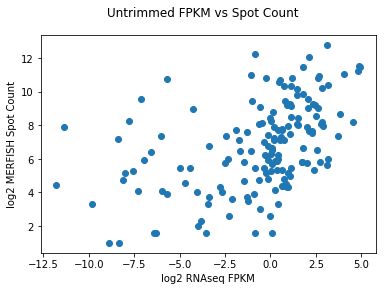

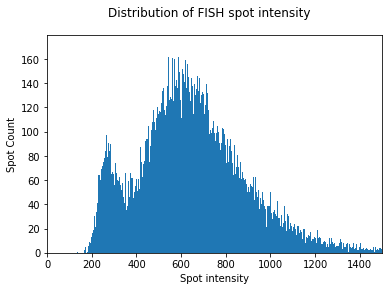

In [33]:
from fish_results import *
import os
import importlib
import pickle
from analysis_scripts.parse_classification_images import *
import pandas as pd
import numpy
from metadata import Metadata
from collections import defaultdict, Counter
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17'
md = Metadata(img_path)

path = '/bigstore/GeneralStorage/Zach/FISHData/codestacks'
hdata = HybeData(path)
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
cvectors = numpy.concatenate((seqfish_config.gene_codeword_vectors,seqfish_config.blank_codeword_vectors),axis=0)
genes = seqfish_config.gids+seqfish_config.bids
zmax = 60
zmin = 0 
pos_df = {}
counts = []
FISH_Spots = {}
DF = []
#Positions = ['Pos4','Pos25','Pos12','Pos10','Pos6','Pos14','Pos13','Pos24','Pos5','Pos28','Pos16','Pos0','Pos8','Pos3','Pos2','Pos15','Pos1','Pos9']
for pos in hdata.metadata.posname.unique():
    hdata = HybeData(os.path.join(path,pos))
    merged_df = {}
    XY = md.image_table[md.image_table.Position==pos].XY.iloc[0]
    print(pos)
    for zindex in hdata.metadata.zindex.unique():
        if zindex >= zmin:
            if zindex <= zmax:
                temp = md.image_table[md.image_table.Position==pos]
                Z = temp[md.image_table[md.image_table.Position==pos].Zindex==zindex].Z.iloc[0]
                cstk = hdata.load_data(pos, zindex, 'cstk')
                class_img = hdata.load_data(pos, zindex, 'cimg')
                df,bit_values = parse_classification_image(class_img,cstk,cvectors,genes,zindex)
                df['z'] = zindex
                df['Position'] = pos
                df['coordX'] = XY[0]
                df['coordY'] = XY[1]
                df['coordZ'] = Z
                merged_df[zindex] = df
                DF.append(df)
                counts = Counter(df.gene)
                for gene in counts.keys():
                    if gene not in FISH_Spots.keys():
                        FISH_Spots[gene] = 0
                    FISH_Spots[gene] = FISH_Spots[gene] + counts[gene]
    pos_df[pos] = merged_df
    df = pd.concat(DF, ignore_index=True)
#pickle.dump(df,open('/bigstore/GeneralStorage/Zach/FISHData/df3.pkl','wb'))  
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
#RNA_Expression = pd.read_csv('/home/zach/Downloads/Cornea Wound Gene List - Inflammation Final.csv')
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots = Counter(df.gene)
for gn,cc in FISH_Spots.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(ccs))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.ylabel('log2 MERFISH Spot Count')
plt.xlabel('log2 RNAseq FPKM')
plt.show()
%matplotlib inline
import matplotlib.pyplot as plt
plt.hist(df.ave,bins=int(len(df.ave)/10))
plt.xlim([0,1500])
plt.suptitle('Distribution of FISH spot intensity')
plt.xlabel('Spot intensity')
plt.ylabel('Spot Count')
plt.show()

In [1]:
new_mask = 'Yes'
if new_mask != 'No':
    print('ok')

ok


In [34]:
len(df)

72790

In [12]:
NFS = []
for pos in hdata.metadata.posname.unique():
    pth = '/bigstore/GeneralStorage/Zach/FISHData/codestacks/'
    hdata=HybeData(os.path.join(pth,pos))
    zidxes = hdata.metadata.zindex.unique()
    nfs = []
    zidxes = hdata.metadata.zindex.unique()
    for z in zidxes:
        if z <= zmax:
            if z >= zmin:
                nfs.append(hdata.load_data(pos, z, 'nf'))
                NFS.append(np.nanmean(nfs, axis=0))
print(np.nanmean(NFS, axis=0))

[ 678.49931156  742.08363893  677.18161816  746.12504997  603.90713151
  619.31163004  449.94210223  469.48198386  503.94828116  508.18515628
  411.40172555  502.1727714   956.69103768 1036.53768952 1066.76650876
  819.67554604  629.40717582  676.53712457]


Pos4
SpearmanrResult(correlation=0.4944469088541815, pvalue=8.444867870228715e-07)


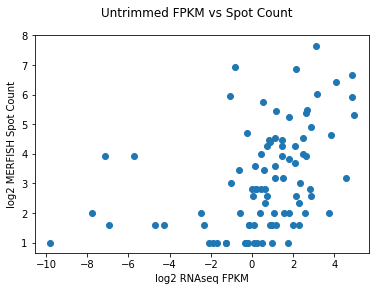

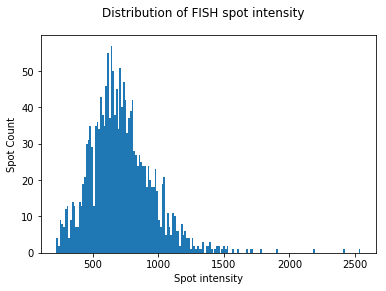

opening img_Pos4_000000081_000000000_DeepBlue_000_081.tif

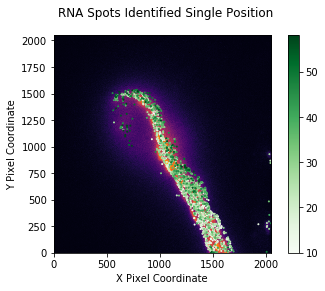

[ 924.91531193  796.73774629  725.3433443   826.39846263  638.09666353
  933.23791863  566.55414177  524.37244729  500.94715971  471.43040377
  433.7923566   474.41084918 1128.42062198 1190.8845897  1256.30784697
  884.10639191  627.98306656  748.08341352]


In [1]:
from fish_results import *
import os
import importlib
import pickle
from analysis_scripts.parse_classification_images import *
import pandas as pd
import numpy
from metadata import Metadata
from collections import defaultdict, Counter
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17'
md = Metadata(img_path)

path = '/bigstore/GeneralStorage/Zach/FISHData/codestacks'
hdata = HybeData(path)
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
cvectors = numpy.concatenate((seqfish_config.gene_codeword_vectors,seqfish_config.blank_codeword_vectors),axis=0)
genes = seqfish_config.gids+seqfish_config.bids
zmax = 60
zmin = 0 
pos_df = {}
counts = []
FISH_Spots = {}
DF = []
#for pos in hdata.metadata.posname.unique():
pos = 'Pos4'
hdata = HybeData(os.path.join(path,pos))
merged_df = {}
XY = md.image_table[md.image_table.Position==pos].XY.iloc[0]
print(pos)
for zindex in hdata.metadata.zindex.unique():
    if zindex >= zmin:
        if zindex <= zmax:
            temp = md.image_table[md.image_table.Position==pos]
            Z = temp[md.image_table[md.image_table.Position==pos].Zindex==zindex].Z.iloc[0]
            cstk = hdata.load_data(pos, zindex, 'cstk')
            class_img = hdata.load_data(pos, zindex, 'cimg')
            temp_df,bit_values = parse_classification_image(class_img,cstk,cvectors,genes,zindex)
            temp_df['z'] = zindex
            temp_df['Position'] = pos
            temp_df['coordX'] = XY[0]
            temp_df['coordY'] = XY[1]
            temp_df['coordZ'] = Z
            DF.append(temp_df)
df_pos = pd.concat(DF, ignore_index=True) 
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
#RNA_Expression = pd.read_csv('/home/zach/Downloads/Cornea Wound Gene List - Inflammation Final.csv')
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots = Counter(df_pos.gene)
for gn,cc in FISH_Spots.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(ccs))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.ylabel('log2 MERFISH Spot Count')
plt.xlabel('log2 RNAseq FPKM')
plt.show()
%matplotlib inline
import matplotlib.pyplot as plt
plt.hist(df_pos.ave,bins=int(len(df_pos.ave)/10))
plt.suptitle('Distribution of FISH spot intensity')
plt.xlabel('Spot intensity')
plt.ylabel('Spot Count')
plt.show()
% matplotlib inline
from mpl_toolkits.mplot3d import axes3d, Axes3D
import matplotlib.pyplot as plt
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
nucstk = md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_1')
im = np.flipud(np.rot90(nucstk[:,:,20]))
implot = plt.imshow(im,cmap='inferno')
temp_df = df_pos
X = []
Y = []
Z = []
for i in range(len(temp_df.centroid)):
    Y.append(temp_df.centroid.iloc[i][1])
    X.append(temp_df.centroid.iloc[i][0])
    Z.append(temp_df.z.iloc[i])
sc = plt.scatter(X,Y,c=Z,cmap='Greens', s=1)
plt.colorbar(sc)
plt.suptitle('RNA Spots Identified Single Position')
plt.xlabel('X Pixel Coordinate')
plt.ylabel('Y Pixel Coordinate')
plt.xlim(0,2048)
plt.ylim(0,2048)
plt.show()
pth = '/bigstore/GeneralStorage/Zach/FISHData/codestacks/'
hdata=HybeData(os.path.join(pth,pos))
zidxes = hdata.metadata.zindex.unique()
nfs = []
zidxes = hdata.metadata.zindex.unique()
for z in zidxes:
    if z <= zmax:
        if z >= zmin:
            nfs.append(hdata.load_data(pos, z, 'nf'))
print(np.nanmean(nfs, axis=0))

opening img_Pos4_000000081_000000000_DeepBlue_000_081.tif

<IPython.core.display.Javascript object>


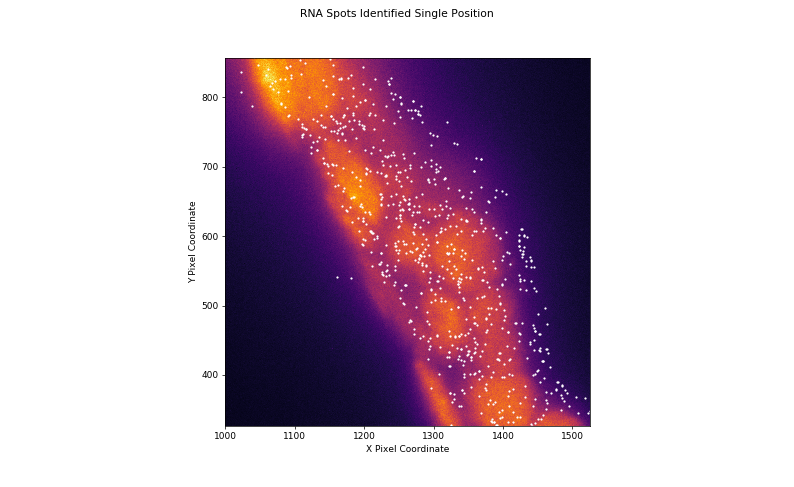

In [35]:
import matplotlib
%matplotlib notebook
%matplotlib notebook
from mpl_toolkits.mplot3d import axes3d, Axes3D
import matplotlib.pyplot as plt
pos = 'Pos4'
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
nucstk = md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_1')
im = np.flipud(np.rot90(nucstk[:,:,20]))
implot = plt.imshow(im,cmap='inferno')
temp_df = df[df.Position==pos]
X = []
Y = []
#Z = []
for i in range(len(temp_df.centroid)):
    Y.append(temp_df.centroid.iloc[i][1])
    X.append(temp_df.centroid.iloc[i][0])
    #Z.append(temp_df.z.iloc[i])
sc = plt.scatter(X,Y,c='w', s=2)
#plt.colorbar(sc)
plt.suptitle('RNA Spots Identified Single Position')
plt.xlabel('X Pixel Coordinate')
plt.ylabel('Y Pixel Coordinate')
plt.xlim(0,2048)
plt.ylim(0,2048)
plt.show()

In [53]:
from metadata import Metadata
pos = 'Pos13'
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
nucstk = md.stkread(Position='Pos13',Channel='DeepBlue',acq='nucstain_1')
redstk = md.stkread(Position='Pos13',Channel='FarRed',acq='hybe1_3')
orangestk = md.stkread(Position='Pos13',Channel='Orange',acq='hybe1_3')

KeyboardInterrupt: 

Exception ignored in: 'zmq.backend.cython.message.Frame.__dealloc__'
Traceback (most recent call last):
  File "zmq/backend/cython/checkrc.pxd", line 12, in zmq.backend.cython.checkrc._check_rc
KeyboardInterrupt


opening img_Pos13_000000081_000000000_Orange_000_081.tifif

<IPython.core.display.Javascript object>


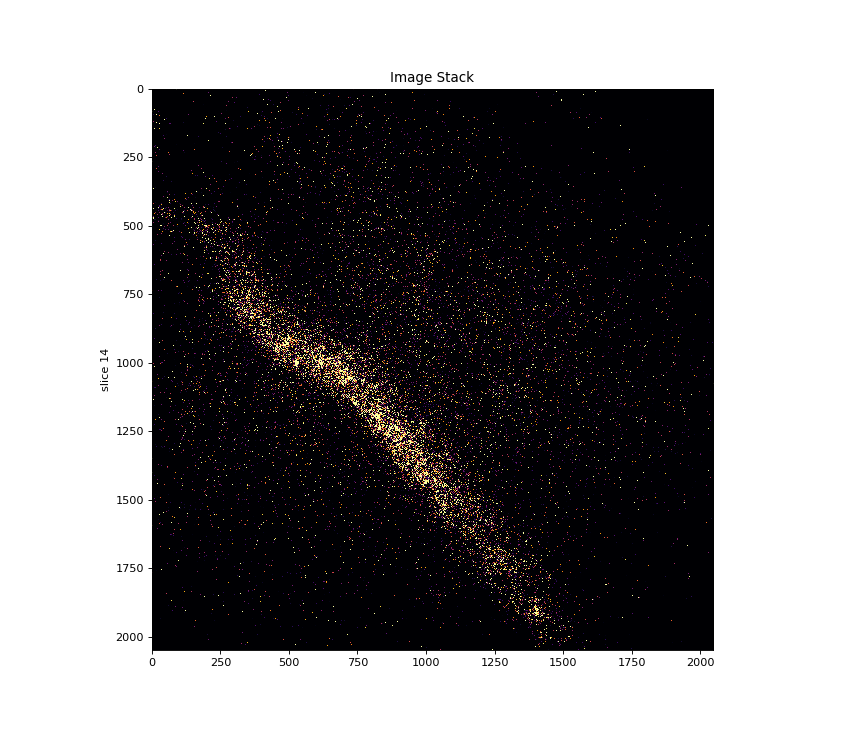

In [28]:
import numpy as np
from pyvis import *
%matplotlib notebook
stkshow(np.rot90(redstk,2),min_thresh=95,max_thresh=99)

In [7]:
import pickle
beads = pickle.load(open('/bigstore/GeneralStorage/Zach/FISHData/results/beads.pkl','rb'))
tforms = pickle.load(open('/bigstore/GeneralStorage/Zach/FISHData/results/tforms.pkl','rb'))
FISH_Spots = pickle.load(open('/bigstore/GeneralStorage/Zach/FISHData/FISH_Spots.pkl','rb'))
DF = pickle.load(open('/bigstore/GeneralStorage/Zach/FISHData/DF.pkl','rb'))
df = pickle.load(open('/bigstore/GeneralStorage/Zach/FISHData/df.pkl','rb'))
df2 = pickle.load(open('/bigstore/GeneralStorage/Zach/FISHData/df2.pkl','rb'))
FISH_Spots_all = pickle.load(open('/bigstore/GeneralStorage/Zach/FISHData/FISH_Spots_all.pkl','rb'))
df_all = pickle.load(open('/bigstore/GeneralStorage/Zach/FISHData/df_all.pkl','rb'))

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log2


<IPython.core.display.Javascript object>


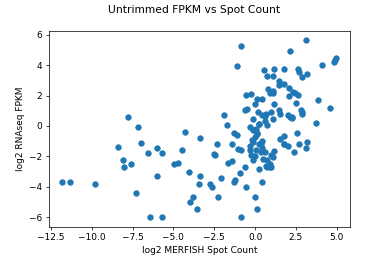

SpearmanrResult(correlation=0.6221194491064435, pvalue=4.385050330288606e-18)


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in log2


Text(0,0.5,'log2 RNAseq FPKM')

In [36]:
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
#RNA_Expression = pd.read_csv('/home/zach/Downloads/Cornea Wound Gene List - Inflammation Final.csv')
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots = Counter(df[df.ave>400].gene)
for gn,cc in FISH_Spots.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
ccs = list(np.array(ccs)/(36))
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(np.divide(ccs,3.6)))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.xlabel('log2 MERFISH Spot Count')
plt.ylabel('log2 RNAseq FPKM')

Text(0,0.5,'Spot Count')

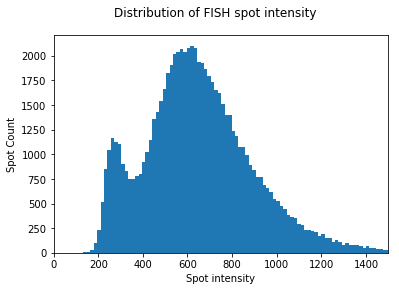

In [37]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.hist(df.ave,bins=500)
plt.xlim([0, 1500])
plt.suptitle('Distribution of FISH spot intensity')
plt.xlabel('Spot intensity')
plt.ylabel('Spot Count')

In [5]:
import importlib
import numpy as np
import pandas as pd
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
gvectors = seqfish_config.gene_codeword_vectors
bvectors = seqfish_config.blank_codeword_vectors
avectors = np.concatenate((gvectors,bvectors),axis=0)
genes = seqfish_config.gids
blanks = seqfish_config.bids
all_names = list(genes + blanks)
columns = np.array([])
for i in range(len(seqfish_config.bitmap)):
    columns = np.append(columns,seqfish_config.bitmap[i][0])
Codebook = pd.DataFrame(avectors)
Codebook.columns = columns
Codebook.index = all_names
Codebook

,RS0095_cy5,RS0109_cy5,RS0175_cy5,RS0237_cy5,RS0307_cy5,RS0332_cy5,RS0384_atto565,RS0406_atto565,RS0451_atto565,RS0468_atto565,RS0548_atto565,RS64.0_atto565,RSN9927.0_cy5,RSN2336.0_cy5,RSN1807.0_cy5,RSN4287.0_atto565,RSN1252.0_atto565,RSN9535.0_atto565
Abhd2,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Abr,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
Acaca,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Acod1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Acvr1b,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Adam8,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
Ahnak2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
Akt2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
Akt3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
Aoah,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0


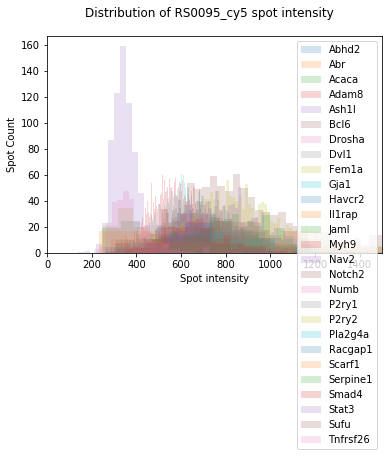

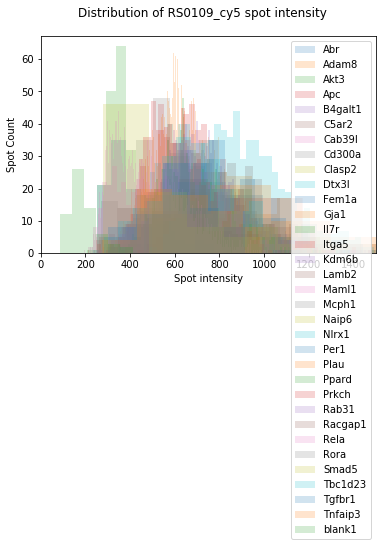

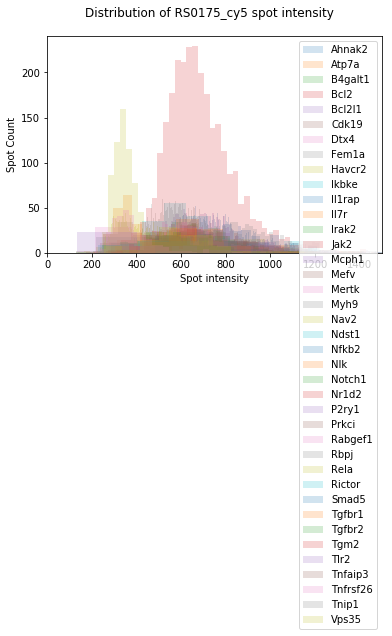

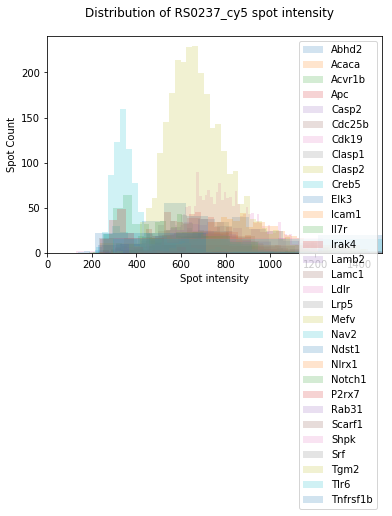

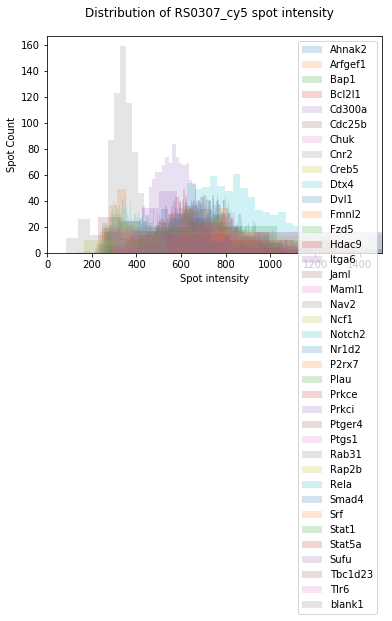

...

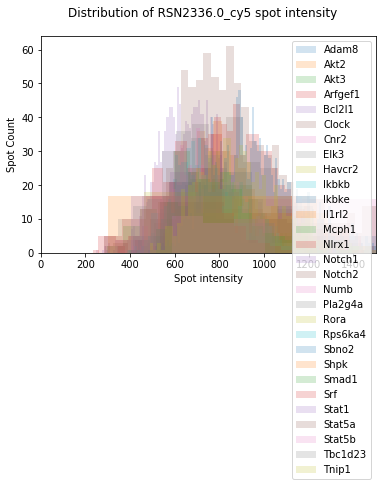

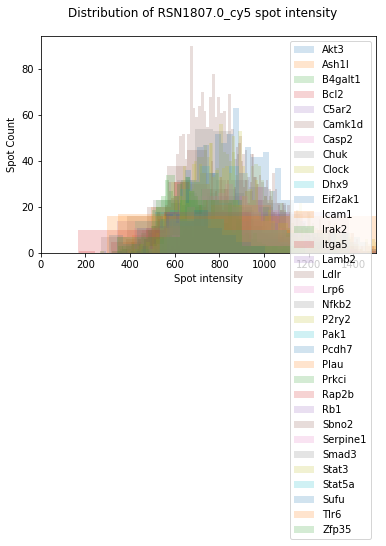

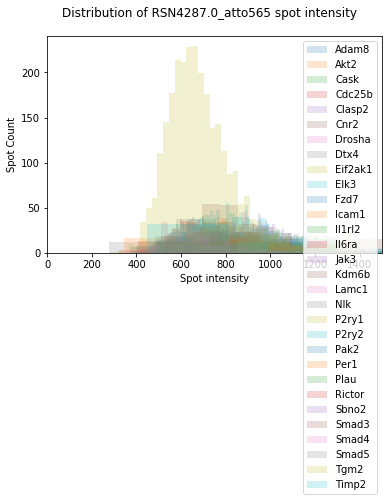

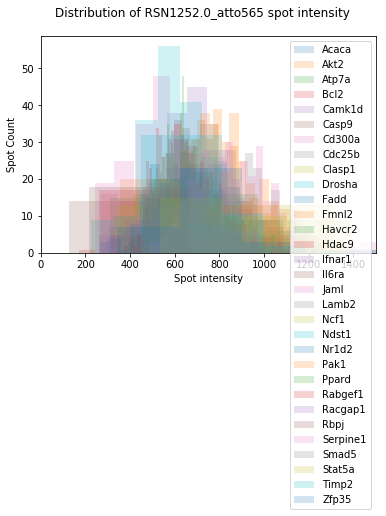

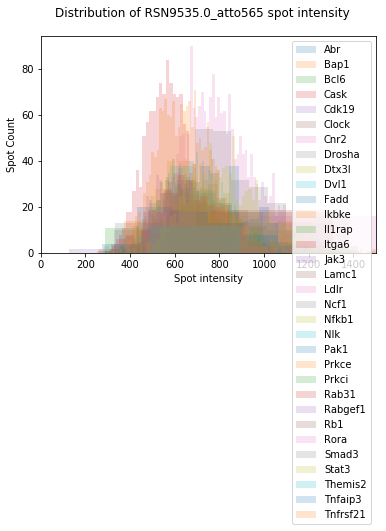

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
for readout in Codebook.columns:
    for gene in Codebook[Codebook[readout]>0].index:
        temp = df_all[df_all.gene==gene].ave
        if len(temp)>10:
            plt.hist(temp[temp>0],bins=(int(len(temp[temp>0])/10)),alpha=0.2, label=gene)
            plt.xlim([0, 1500])
    plt.suptitle('Distribution of '+str(readout)+' spot intensity')
    plt.xlabel('Spot intensity')
    plt.ylabel('Spot Count')
    plt.legend(loc='upper right')
    plt.show()

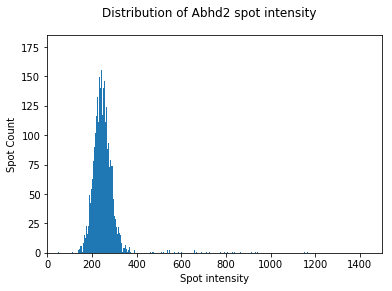

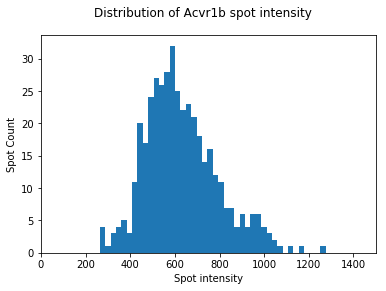

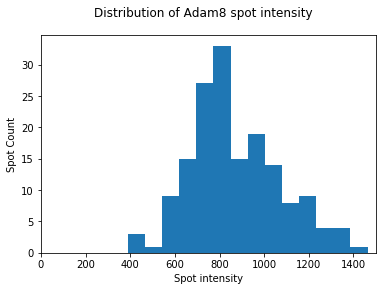

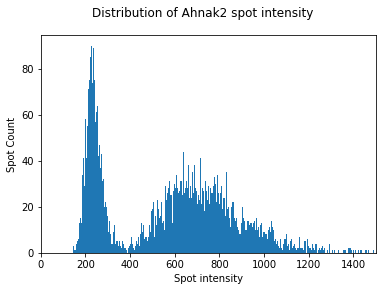

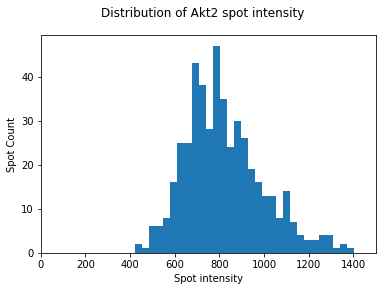

...

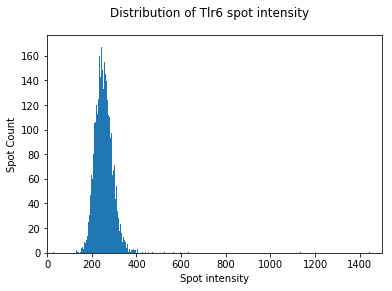

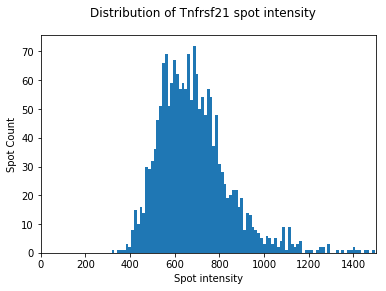

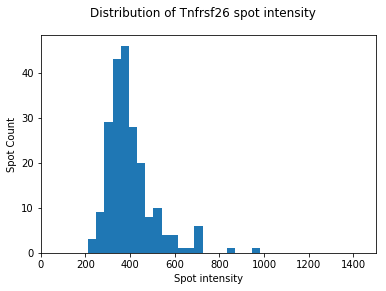

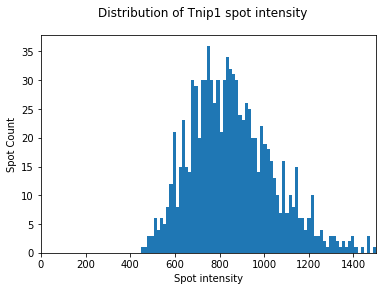

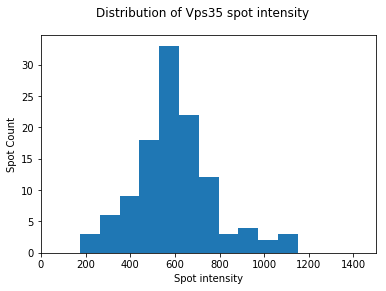

In [7]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
for gene in np.unique(df.gene):
    if int(len(df[df.gene==gene].ave)/10)>10:
        plt.hist(df[df.gene==gene].ave,bins=int(len(df[df.gene==gene].ave)/10))
        plt.xlim([0, 1500])
        plt.suptitle('Distribution of '+gene+' spot intensity')
        plt.xlabel('Spot intensity')
        plt.ylabel('Spot Count')
        plt.show()

Text(0.5,0,'Z plane')

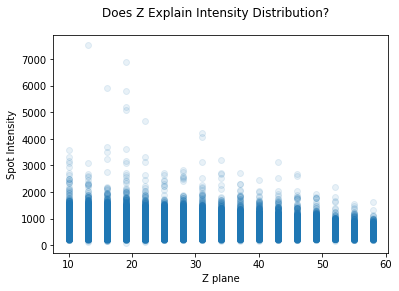

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
Z = df.z
Intensity = df.ave
plt.scatter(Z,Intensity,alpha=0.1)
plt.suptitle('Does Z Explain Intensity Distribution?')
plt.ylabel('Spot Intensity')
plt.xlabel('Z plane')

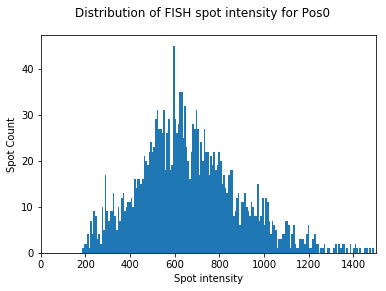

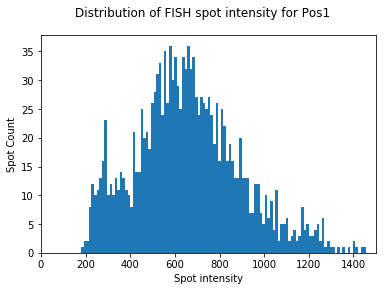

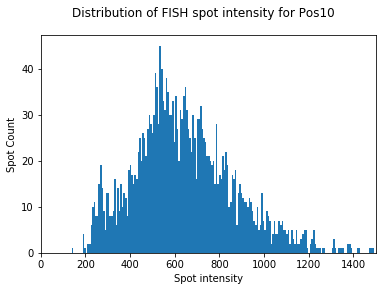

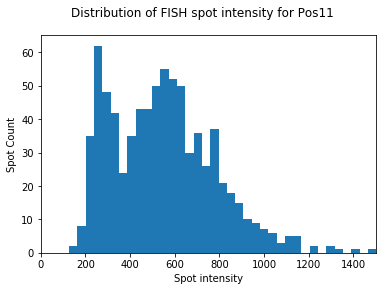

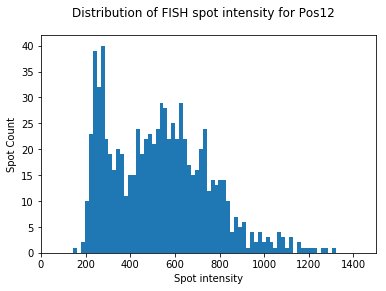

...

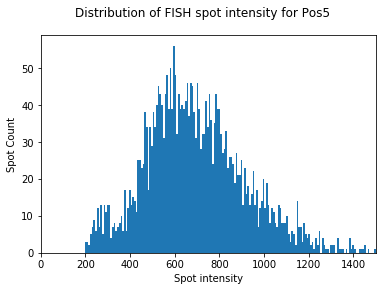

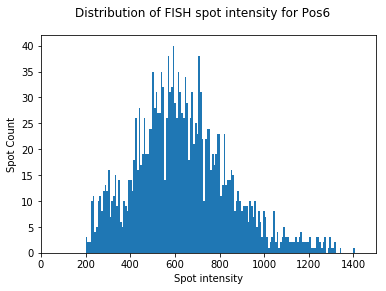

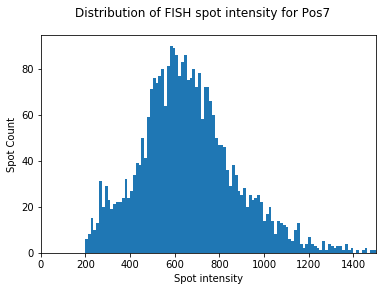

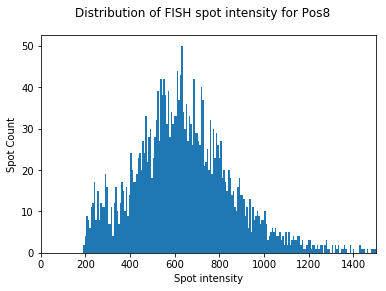

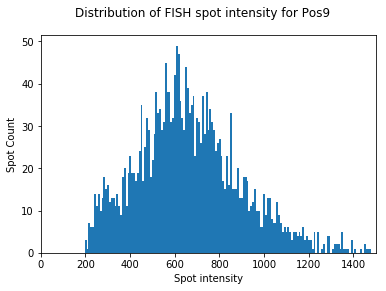

In [22]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
for pos in np.unique(df.Position):
    temp_df = df[df.Position==pos]
    plt.hist(temp_df[temp_df.ave>0].ave,bins=int(len(temp_df[temp_df.ave>0].ave)/10))
    plt.xlim([0, 1500])
    plt.suptitle('Distribution of FISH spot intensity for '+str(pos))
    plt.xlabel('Spot intensity')
    plt.ylabel('Spot Count')
    plt.show()

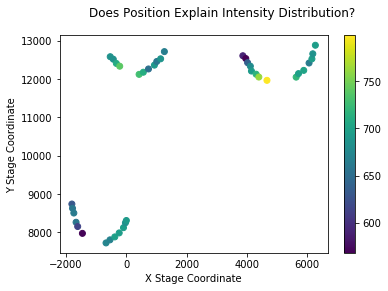

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
X = []
Y = []
Intensity = []
import numpy as np
for pos in np.unique(df.Position):
    X.append(df[df.Position==pos].coordX.mean())
    Y.append(df[df.Position==pos].coordY.mean())
    Intensity.append(df[df.Position==pos].ave.mean())
sc = plt.scatter(X,Y,c=Intensity)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle('Does Position Explain Intensity Distribution?')
plt.colorbar(sc)
plt.show()

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log2


<IPython.core.display.Javascript object>


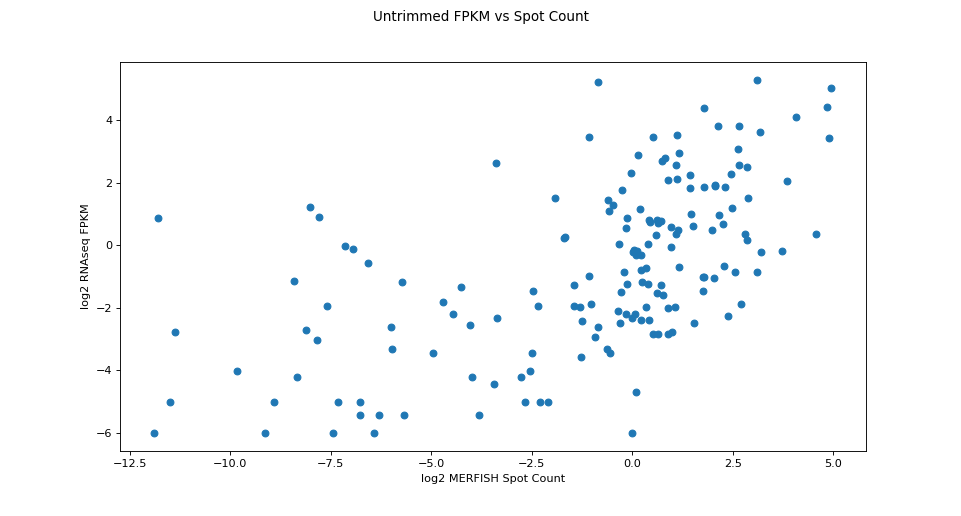

SpearmanrResult(correlation=0.6045951531582846, pvalue=8.043927587995929e-18)


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in log2


Text(0,0.5,'log2 RNAseq FPKM')

In [12]:
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
#RNA_Expression = pd.read_csv('/home/zach/Downloads/Cornea Wound Gene List - Inflammation Final.csv')
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots_all = Counter(df_all.gene)
for gn,cc in FISH_Spots_all.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
ccs = list(np.array(ccs)/(36))
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(np.divide(ccs,3.6)))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.xlabel('log2 MERFISH Spot Count')
plt.ylabel('log2 RNAseq FPKM')

<IPython.core.display.Javascript object>


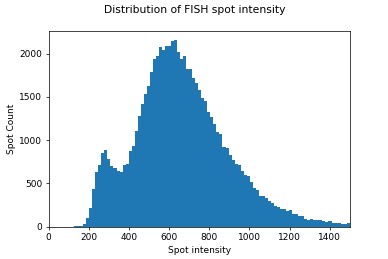

Text(0,0.5,'Spot Count')

In [24]:
%matplotlib notebook
%matplotlib notebook
import matplotlib.pyplot as plt
plt.hist(df.ave,bins=500)
plt.xlim([0, 1500])
plt.suptitle('Distribution of FISH spot intensity')
plt.xlabel('Spot intensity')
plt.ylabel('Spot Count')

SpearmanrResult(correlation=0.6273691938195491, pvalue=1.899569232557959e-18)


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log2
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in log2


Text(0,0.5,'log2 RNAseq FPKM')

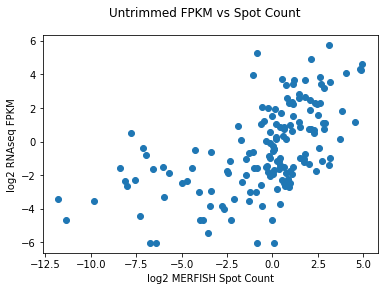

In [16]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
#RNA_Expression = pd.read_csv('/home/zach/Downloads/Cornea Wound Gene List - Inflammation Final.csv')
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots_all = Counter(df[df.ave>400].gene)
for gn,cc in FISH_Spots_all.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
ccs = list(np.array(ccs)/(36))
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(np.divide(ccs,3.6)))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.xlabel('log2 MERFISH Spot Count')
plt.ylabel('log2 RNAseq FPKM')

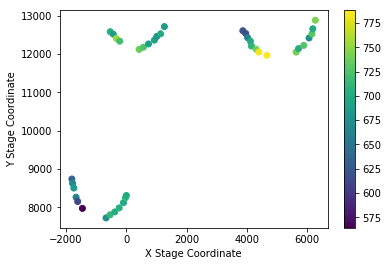

In [15]:
%matplotlib inline
import matplotlib.pyplot as plt
temp_df = df_all
X = []
Y = []
Intensity = []
import numpy as np
for pos in np.unique(temp_df.Position):
    X.append(temp_df[temp_df.Position==pos].coordX.mean())
    Y.append(temp_df[temp_df.Position==pos].coordY.mean())
    Intensity.append(temp_df[df_all.Position==pos].ave.mean())
sc = plt.scatter(X,Y,c=Intensity)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.colorbar(sc)
plt.show()

In [25]:
import importlib
blank = 0
total = 0
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
FISH_Spots = Counter(df.gene)
for gene in FISH_Spots.keys():
    if 'blank' in gene:
        blank = blank + FISH_Spots[gene]
        print(gene,FISH_Spots[gene])
        total = total + FISH_Spots[gene]
    else:
        total = total + FISH_Spots[gene]
print(blank,'false positives')
print(total,'total called')
FPR = (100*blank/total)*(len(seqfish_config.gids)/len(seqfish_config.bids))
print(len(seqfish_config.gids), 'total genes')
print(len(seqfish_config.bids), 'total blanks')
print(FPR,'FPR %')

0 false positives
72060 total called
171 total genes
16 total blanks
0.0 FPR %


In [79]:
import importlib
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
blank = 0
total = 0
FISH_Spots_Trimmed = Counter(df_all[df_all.ave>400].gene)
for gene in FISH_Spots_Trimmed.keys():
    if 'blank' in gene:
        blank = blank + FISH_Spots_Trimmed[gene]
        print(gene,FISH_Spots_Trimmed[gene])
        total = total + FISH_Spots_Trimmed[gene]
    else:
        total = total + FISH_Spots_Trimmed[gene]
print(blank,'false positives')
print(total,'total called')
FPR = (100*blank/total)*(len(seqfish_config.gids)/len(seqfish_config.bids))
print(len(seqfish_config.gids), 'total genes')
print(len(seqfish_config.bids), 'total blanks')
print(FPR,'FPR %')

blank15 2
blank7 1
blank1 1
4 false positives
55011 total called
171 total genes
16 total blanks
0.0777117303811965 FPR %


<IPython.core.display.Javascript object>


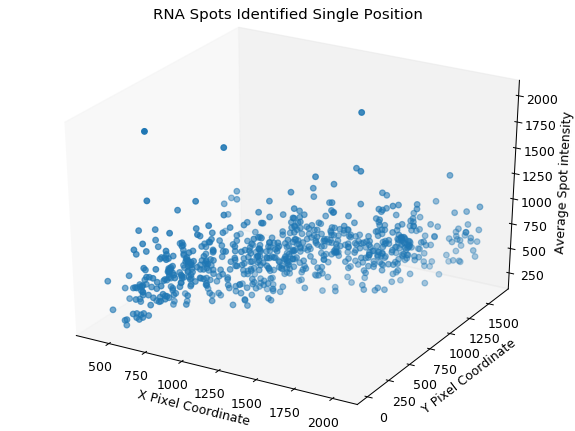

In [2]:
%matplotlib notebook
from mpl_toolkits.mplot3d import axes3d, Axes3D
import matplotlib.pyplot as plt
Pos13_df = df_all[df_all.Position=='Pos13']
X = []
Y = []
Intensity = []
fig = plt.figure()
ax = Axes3D(fig)
for i in range(len(Pos13_df.centroid)):
    Y.append(Pos13_df.centroid.iloc[i][0])
    X.append(Pos13_df.centroid.iloc[i][1])
    Intensity.append(Pos13_df.ave.iloc[i])
cset = ax.scatter(X,Y,Intensity)
ax.clabel(cset, fontsize=9, inline=1)
plt.suptitle('RNA Spots Identified Single Position')
ax.set_xlabel('X Pixel Coordinate')
ax.set_ylabel('Y Pixel Coordinate')
ax.set_zlabel('Average Spot intensity')
ax.grid(False)
# plt.axis('off')
plt.show()

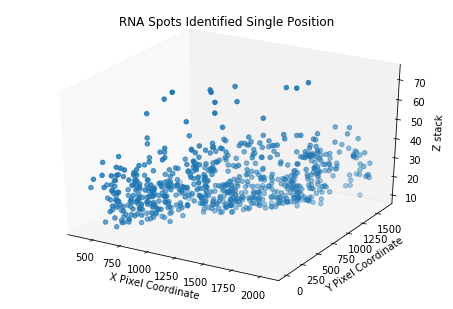

In [33]:
% matplotlib inline
from mpl_toolkits.mplot3d import axes3d, Axes3D
import matplotlib.pyplot as plt
temp_df = df_all[df_all.Position=='Pos13']
X = []
Y = []
Z = []
fig = plt.figure()
ax = Axes3D(fig)
for i in range(len(temp_df.centroid)):
    Y.append(temp_df.centroid.iloc[i][0])
    X.append(temp_df.centroid.iloc[i][1])
    Z.append(temp_df.z.iloc[i])
cset = ax.scatter(X,Y,Z)
ax.clabel(cset, fontsize=9, inline=1)
plt.suptitle('RNA Spots Identified Single Position')
ax.set_xlabel('X Pixel Coordinate')
ax.set_ylabel('Y Pixel Coordinate')
ax.set_zlabel('Z stack')
ax.grid(False)
# plt.axis('off')
plt.show()

<IPython.core.display.Javascript object>


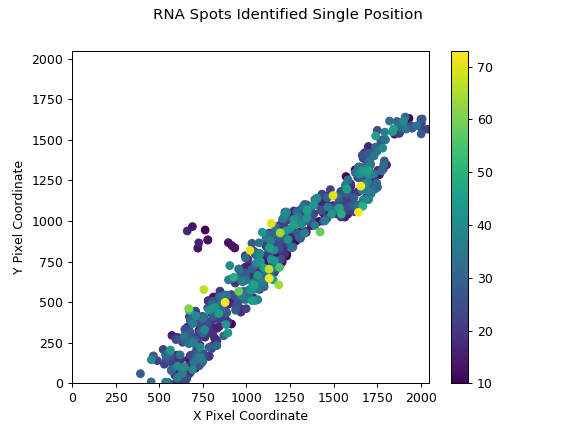

(0, 2048)

In [14]:
%matplotlib notebook
import matplotlib.pyplot as plt
temp_df = df_all[df_all.Position=='Pos13']
X = []
Y = []
Z = []
for i in range(len(temp_df.centroid)):
    Y.append(temp_df.centroid.iloc[i][0])
    X.append(temp_df.centroid.iloc[i][1])
    Z.append(temp_df.z.iloc[i])
sc = plt.scatter(X,Y,c=Z)
plt.colorbar(sc)
plt.suptitle('RNA Spots Identified Single Position')
plt.xlabel('X Pixel Coordinate')
plt.ylabel('Y Pixel Coordinate')
plt.xlim(0,2048)
plt.ylim(0,2048)

In [17]:
from metadata import Metadata
pos = 'Pos13'
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
nucstk = md.stkread(Position='Pos13',Channel='DeepBlue',acq='nucstain_1')

opening img_Pos13_000000081_000000000_DeepBlue_000_081.tif

<IPython.core.display.Javascript object>


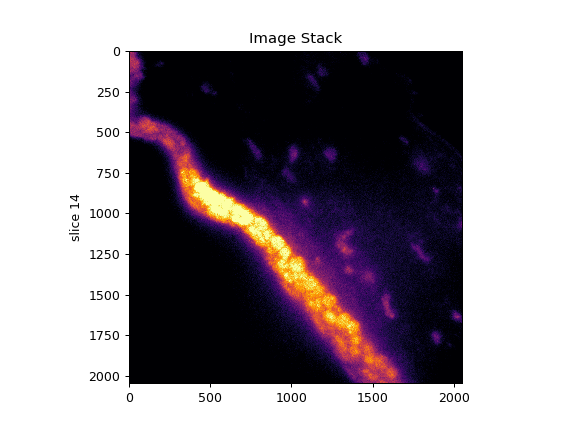

In [7]:
import numpy as np
from pyvis import *
%matplotlib notebook
stkshow(np.rot90(nucstk,2),min_thresh=50,max_thresh=99)

<IPython.core.display.Javascript object>


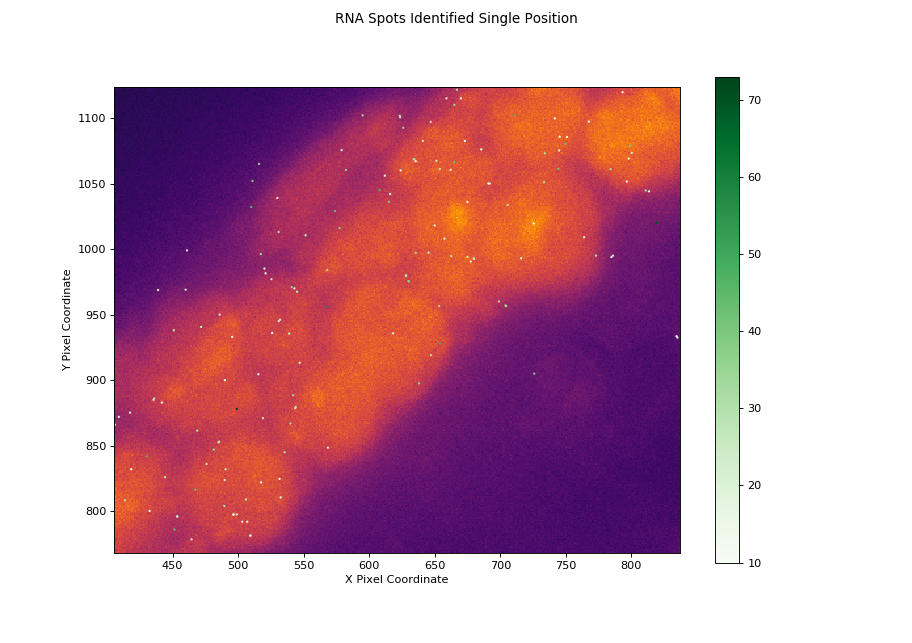

In [35]:
%matplotlib notebook
import matplotlib.pyplot as plt
im = np.flipud(np.rot90(nucstk[:,:,20]))
implot = plt.imshow(im,cmap='inferno')
temp_df = df_all[df_all.Position=='Pos13']
X = []
Y = []
Z = []
for i in range(len(temp_df.centroid)):
    Y.append(temp_df.centroid.iloc[i][1])
    X.append(temp_df.centroid.iloc[i][0])
    Z.append(temp_df.z.iloc[i])
sc = plt.scatter(X,Y,c=Z,cmap='Greens', s=1)
plt.colorbar(sc)
plt.suptitle('RNA Spots Identified Single Position')
plt.xlabel('X Pixel Coordinate')
plt.ylabel('Y Pixel Coordinate')
plt.xlim(0,2048)
plt.ylim(0,2048)
plt.show()

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]


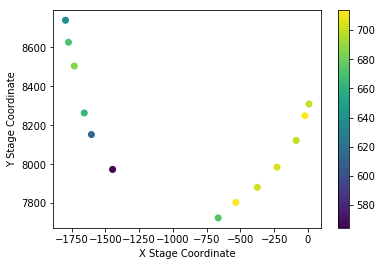

In [8]:
%matplotlib inline
import matplotlib.pyplot as plt
cornea1_df = df_all[df_all.coordX<1000]
cornea1_df = cornea1_df[cornea1_df.coordY<9000]
temp_df = cornea1_df
X = []
Y = []
Intensity = []
import numpy as np
for pos in np.unique(temp_df.Position):
    X.append(temp_df[temp_df.Position==pos].coordX.mean())
    Y.append(temp_df[temp_df.Position==pos].coordY.mean())
    Intensity.append(temp_df[df_all.Position==pos].ave.mean())
sc = plt.scatter(X,Y,c=Intensity)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.colorbar(sc)
plt.show()

In [17]:
%matplotlib inline
import matplotlib.pyplot as plt
import scipy
cornea1_df = df_all[df_all.coordX<1000]
cornea1_df = cornea1_df[cornea1_df.coordY<9000]
temp_df = cornea1_df
X = []
Y = []
Intensity = []
import numpy as np
for pos in np.unique(temp_df.Position):
    X.append(temp_df[temp_df.Position==pos].coordX.mean())
    Y.append(temp_df[temp_df.Position==pos].coordY.mean())
    Intensity.append(temp_df[df_all.Position==pos].ave.mean())
f = scipy.interpolate.interp1d(X,Y,kind='quadratic')
xnew = np.linspace(-2000,0,num=100,endpoint=True)
sc = plt.scatter(X,Y,'o',xnew,f(xnew),'-')
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.colorbar(sc)
plt.show()

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ValueError: A value in x_new is below the interpolation range.

<IPython.core.display.Javascript object>


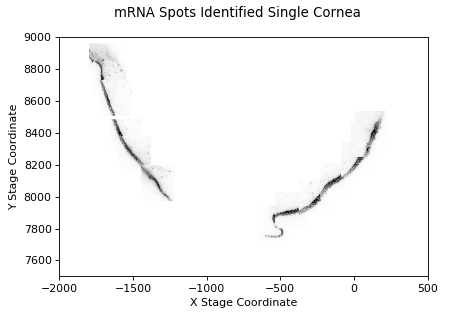

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

In [44]:
%matplotlib notebook
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox
cornea1_df = df[df.coordX<1000]
cornea1_df = cornea1_df[cornea1_df.coordY<9000]
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
fig = plt.figure()
ax = fig.add_subplot(111)
artists = []
for pos in np.unique(cornea1_df.Position):
    x = cornea1_df[cornea1_df.Position==pos].coordX.iloc[0]
    y = cornea1_df[cornea1_df.Position==pos].coordY.iloc[0]
    im = np.rot90(md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_1',Zindex=25)[:,:,0],2)
    bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
    bb2 = TransformedBbox(bb,ax.transData)
    bbox_image = BboxImage(bb2,
                        norm = None,
                        origin=None,
                        clip_on=False,
                        cmap='Greys')
    bbox_image.set_data(im)
    ax.add_artist(bbox_image)
ax.set_xlim(-2000,500)
ax.set_ylim(7500,9000)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle('mRNA Spots Identified Single Cornea')
plt.show()
fig.savefig('/bigstore/GeneralStorage/Zach/FISHData/results/CorneaSpots1')

<IPython.core.display.Javascript object>


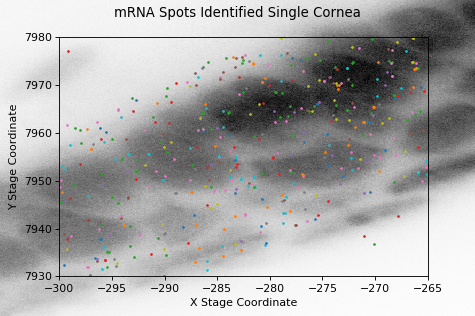

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

In [51]:
%matplotlib notebook
%matplotlib notebook
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox
cornea1_df = df[df.coordX<1000]
cornea1_df = cornea1_df[cornea1_df.coordY<9000]
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
fig = plt.figure()
ax = fig.add_subplot(111)
artists = []
for pos in np.unique(cornea1_df.Position):
    x = cornea1_df[cornea1_df.Position==pos].coordX.iloc[0]
    y = cornea1_df[cornea1_df.Position==pos].coordY.iloc[0]
    im = np.rot90(md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_1',Zindex=25)[:,:,0],2)
    bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
    bb2 = TransformedBbox(bb,ax.transData)
    bbox_image = BboxImage(bb2,
                        norm = None,
                        origin=None,
                        clip_on=False,
                        cmap='Greys')
    bbox_image.set_data(im)
    ax.add_artist(bbox_image)

pixelsize = 0.109
cameradirection = [-1,1]
for gene in cornea1_df.gene.unique():
    temp_df = cornea1_df[cornea1_df.gene==gene]
    X = []
    Y = []
    for i in range(len(temp_df.centroid)):
        rx = temp_df.centroid.iloc[i][1]-2048
        ry = temp_df.centroid.iloc[i][0]#-2048
        x = rx*pixelsize*cameradirection[0]+temp_df.coordX.iloc[i]
        y = ry*pixelsize*cameradirection[1]+temp_df.coordY.iloc[i]
        X.append(x)
        Y.append(y)
    plt.scatter(X,Y,s=2)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle('mRNA Spots Identified Single Cornea')

ax.set_xlim(-300,-265)
ax.set_ylim(7930,7980)
plt.show()
fig.savefig('/bigstore/GeneralStorage/Zach/FISHData/results/CorneaSpots7')

<IPython.core.display.Javascript object>


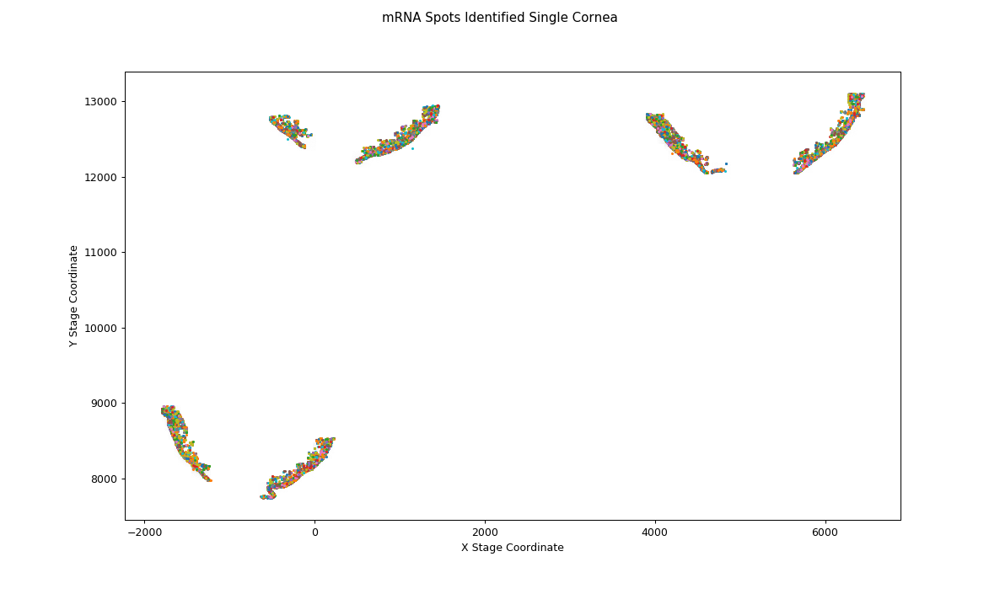

opening img_Pos9_000000025_000000000_DeepBlue_000_025.tiff

In [52]:
%matplotlib notebook
%matplotlib notebook
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
fig = plt.figure()
ax = fig.add_subplot(111)
artists = []
cornea1_df = df
for pos in np.unique(cornea1_df.Position):
    x = cornea1_df[cornea1_df.Position==pos].coordX.iloc[0]
    y = cornea1_df[cornea1_df.Position==pos].coordY.iloc[0]
    im = np.rot90(md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_1',Zindex=25)[:,:,0],2)
    bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
    bb2 = TransformedBbox(bb,ax.transData)
    bbox_image = BboxImage(bb2,
                        norm = None,
                        origin=None,
                        clip_on=False,
                        cmap='Greys')
    bbox_image.set_data(im)
    ax.add_artist(bbox_image)

pixelsize = 0.109
cameradirection = [-1,1]
for gene in cornea1_df.gene.unique():
    temp_df = cornea1_df[cornea1_df.gene==gene]
    X = []
    Y = []
    for i in range(len(temp_df.centroid)):
        rx = temp_df.centroid.iloc[i][1]-2048
        ry = temp_df.centroid.iloc[i][0]#-2048
        x = rx*pixelsize*cameradirection[0]+temp_df.coordX.iloc[i]
        y = ry*pixelsize*cameradirection[1]+temp_df.coordY.iloc[i]
        X.append(x)
        Y.append(y)
    plt.scatter(X,Y,s=2)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle('mRNA Spots Identified Single Cornea')
plt.show()

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

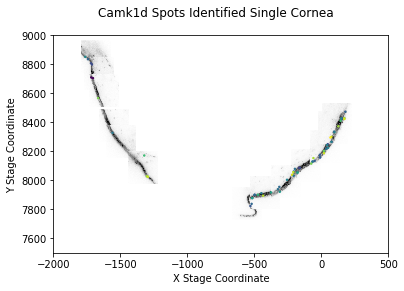

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

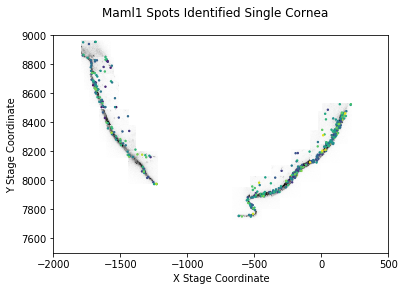

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

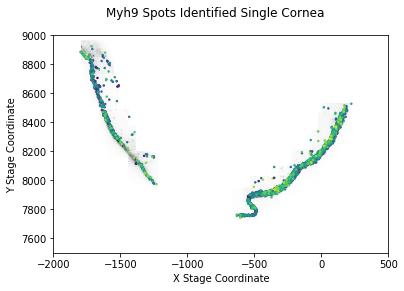

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

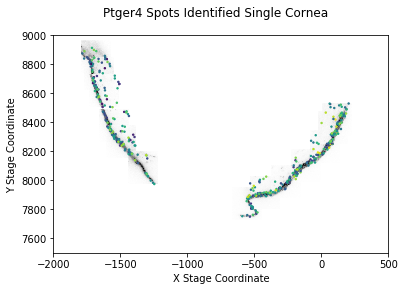

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

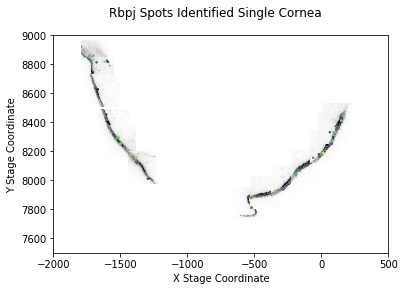

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

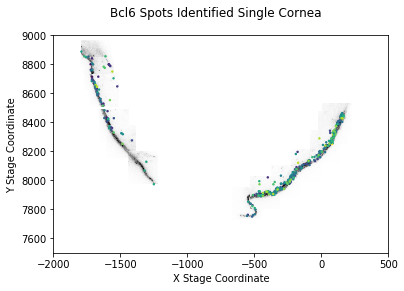

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

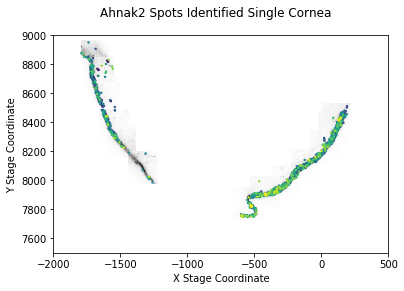

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

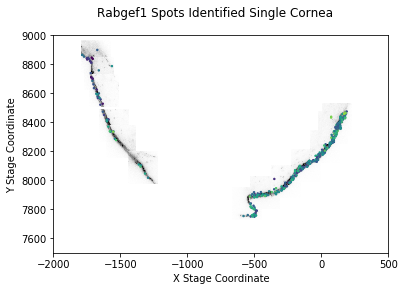

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

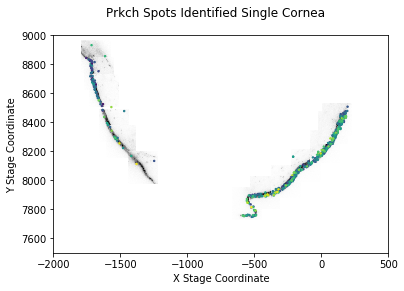

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

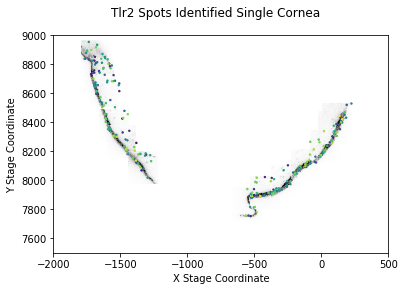

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

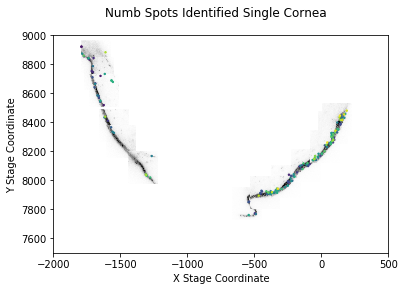

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

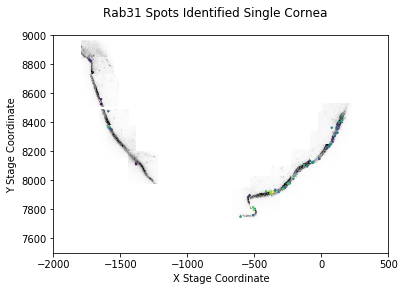

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

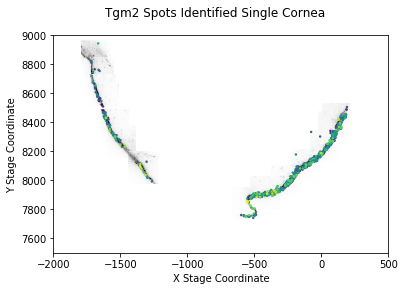

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

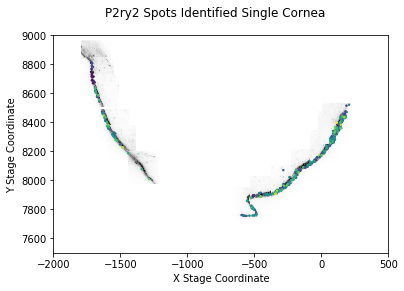

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

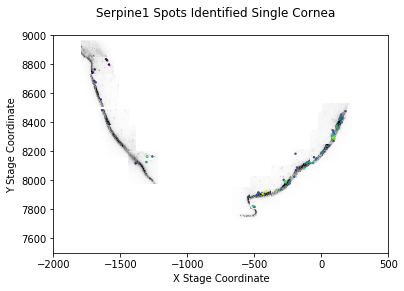

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

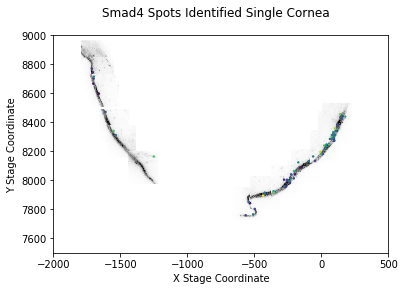

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

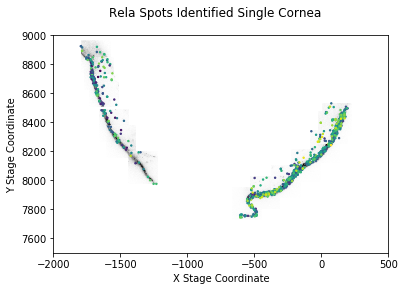

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

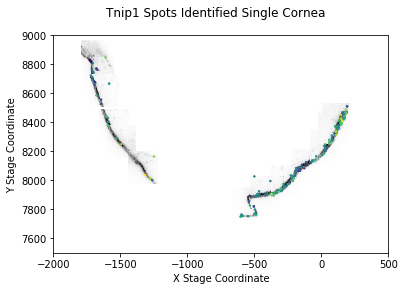

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

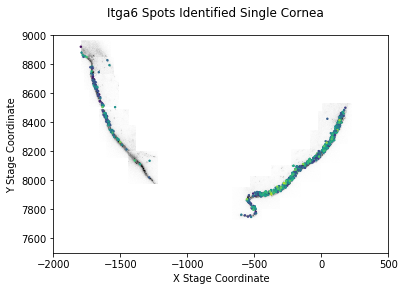

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

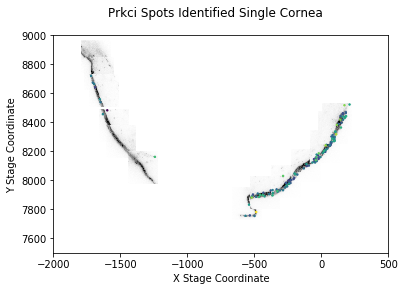

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

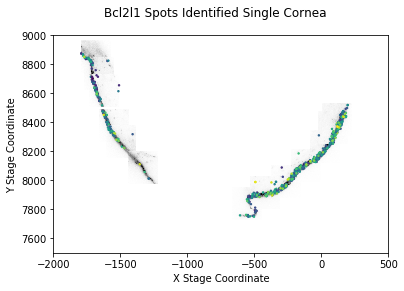

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

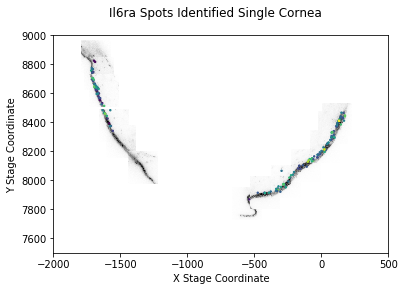

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

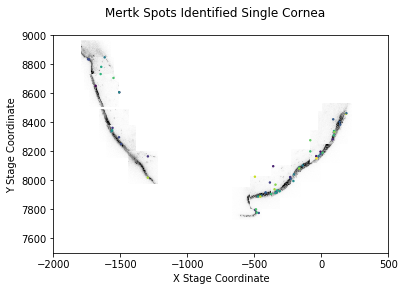

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

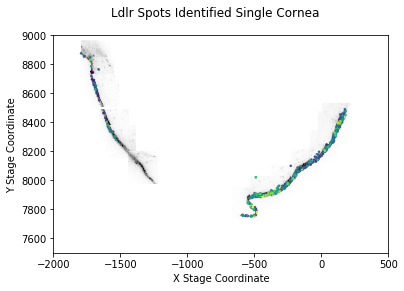

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

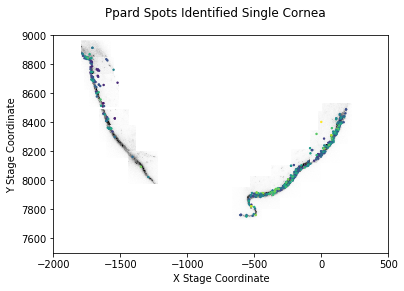

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

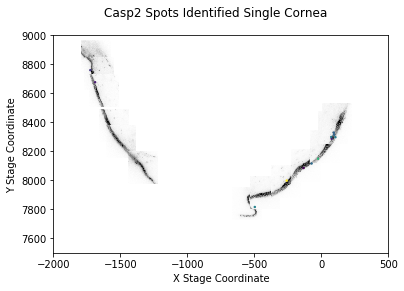

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

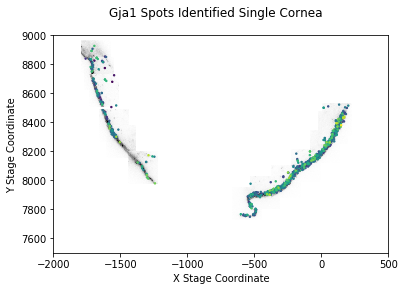

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

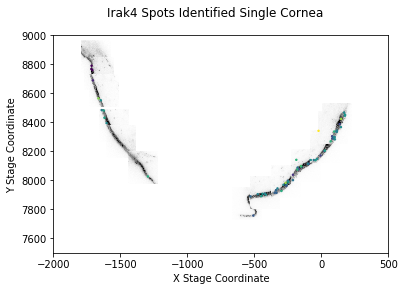

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

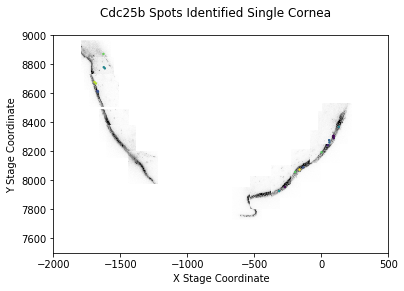

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

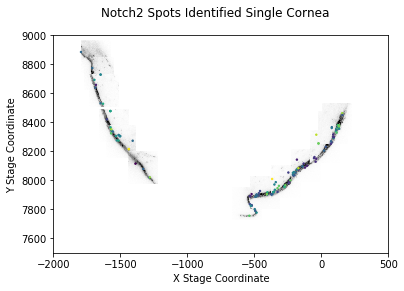

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

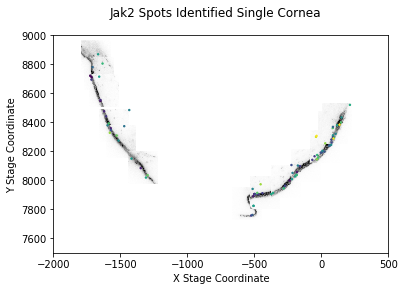

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

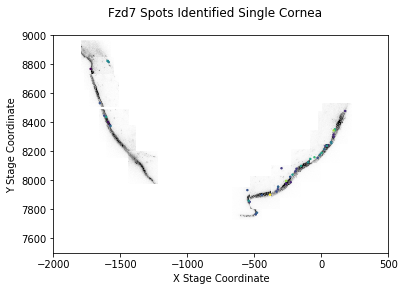

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

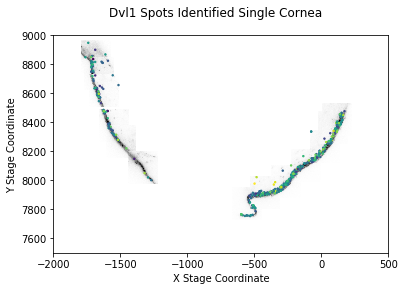

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

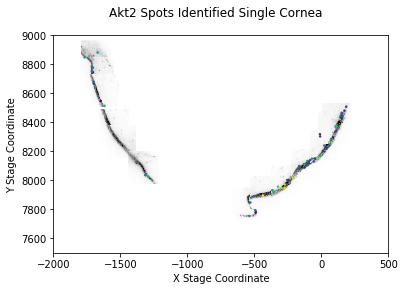

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

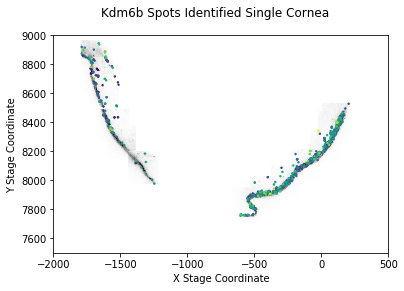

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

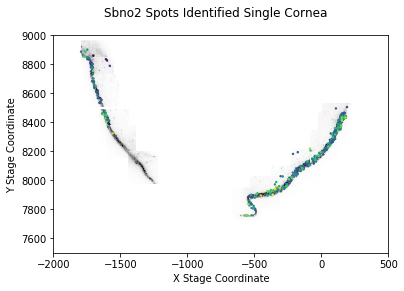

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

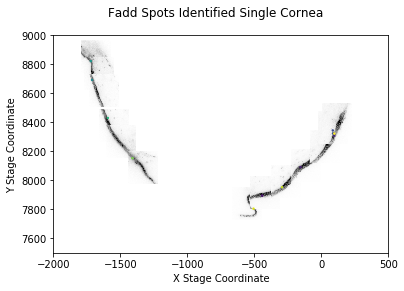

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

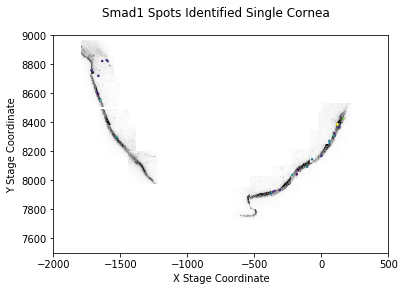

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

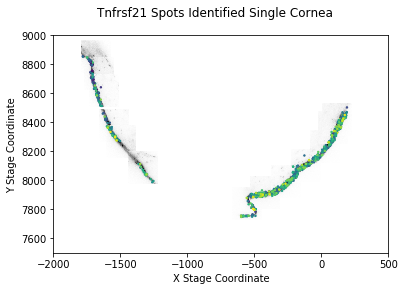

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

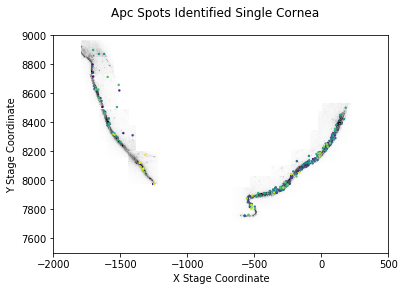

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

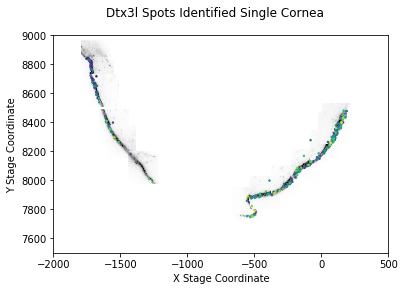

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

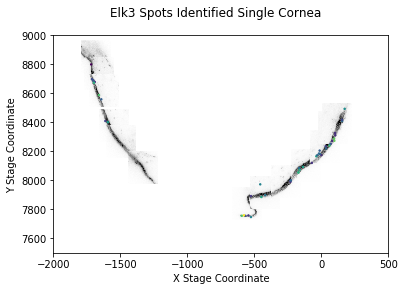

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

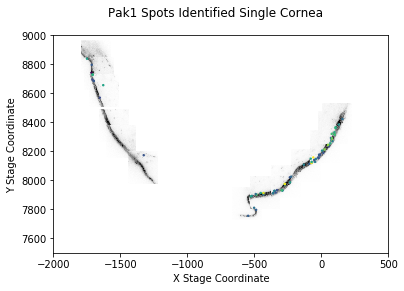

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

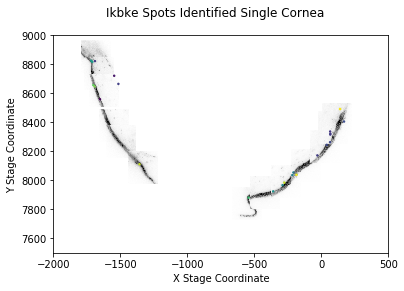

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

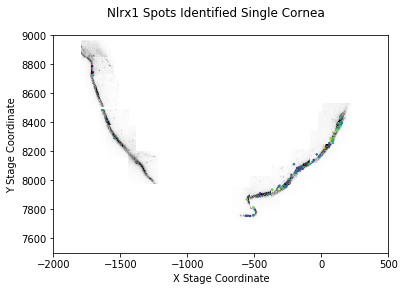

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

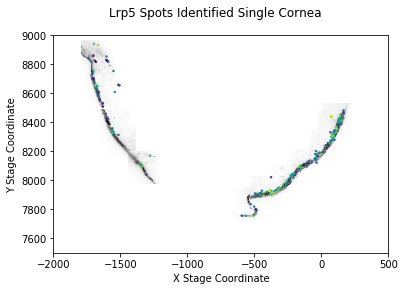

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

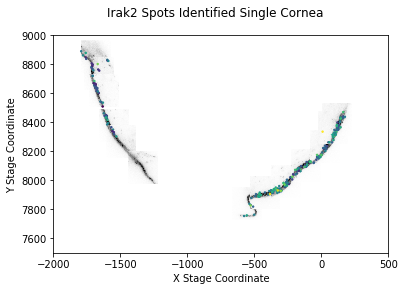

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

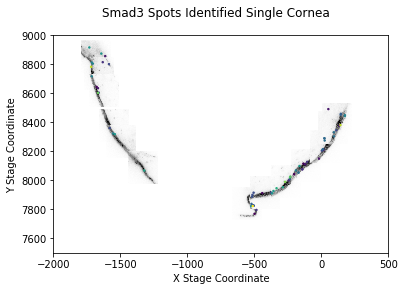

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

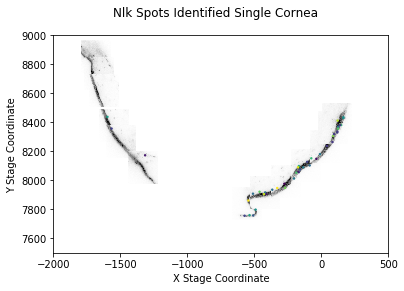

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

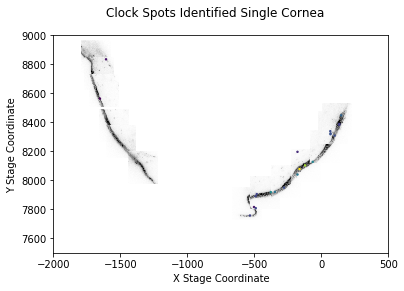

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

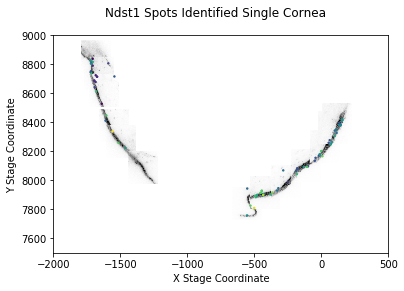

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

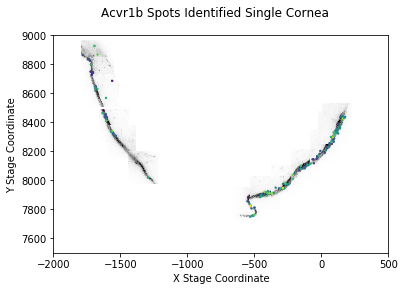

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

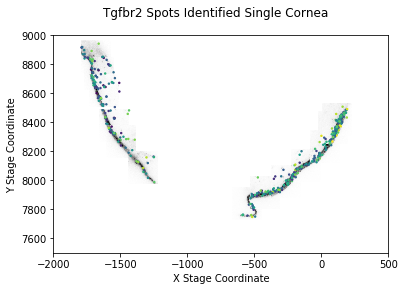

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

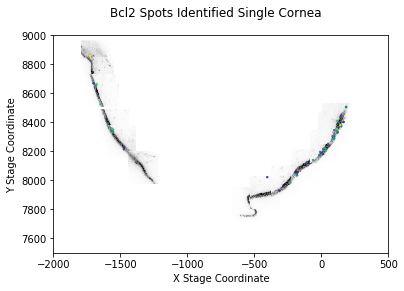

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

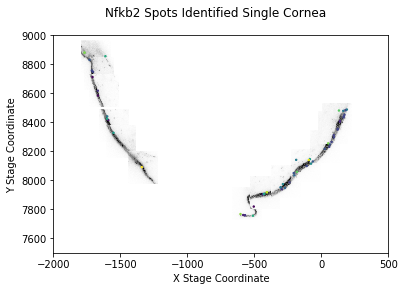

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

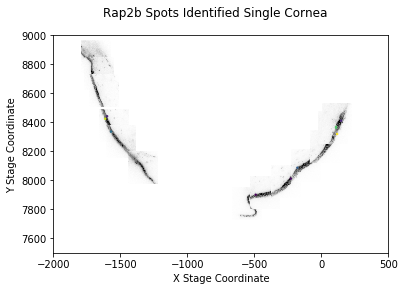

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

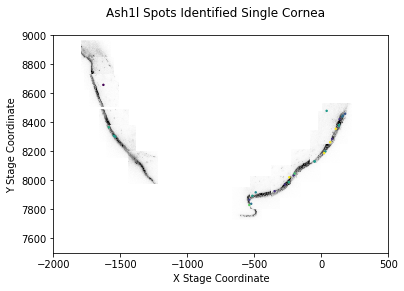

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

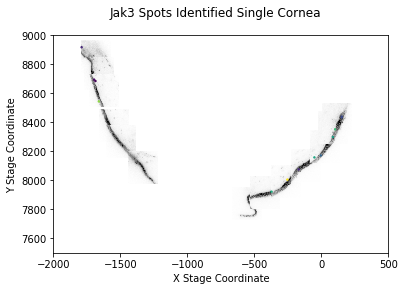

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

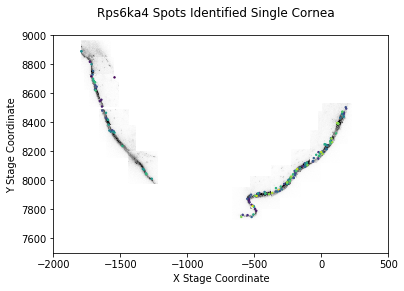

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

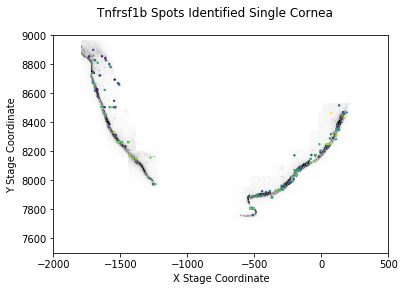

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

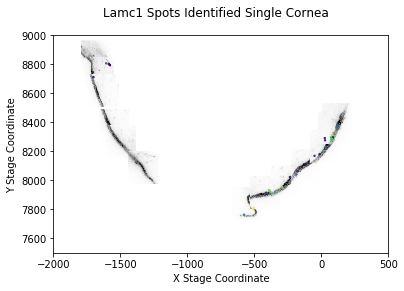

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

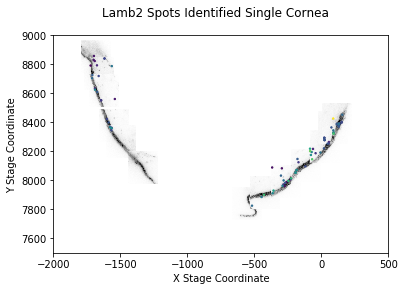

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

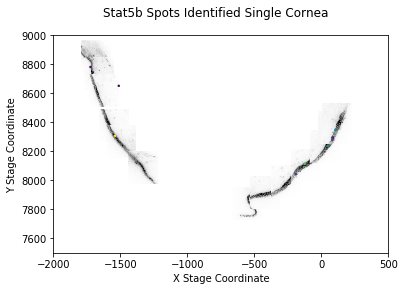

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

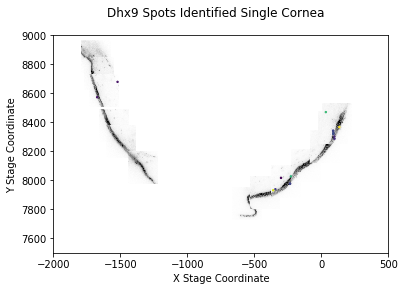

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

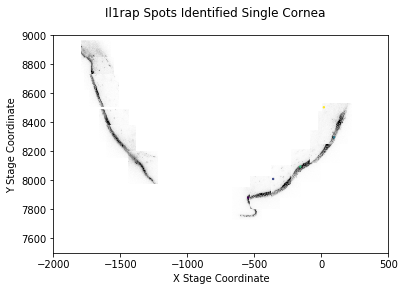

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

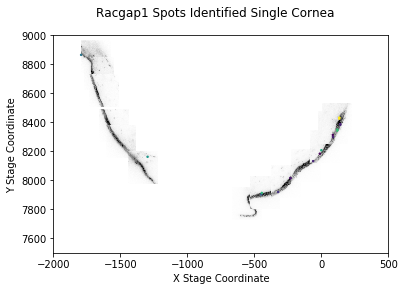

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

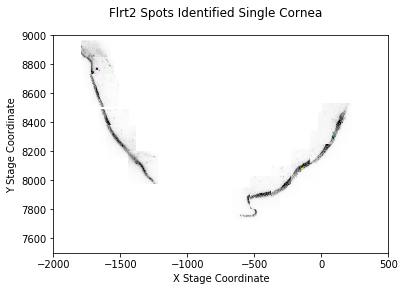

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

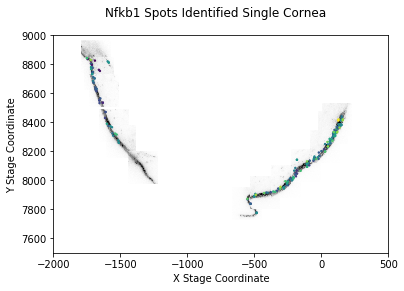

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

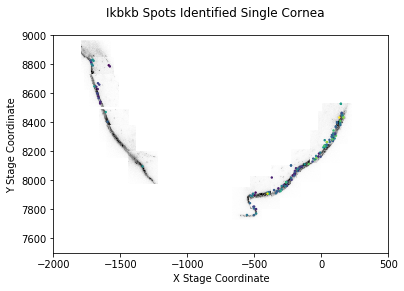

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

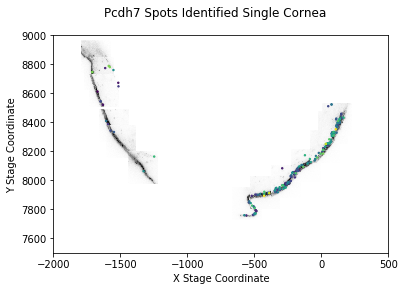

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

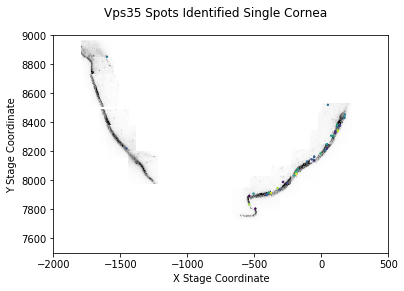

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

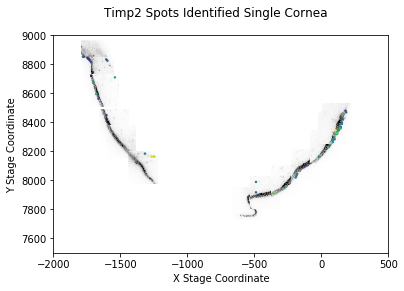

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

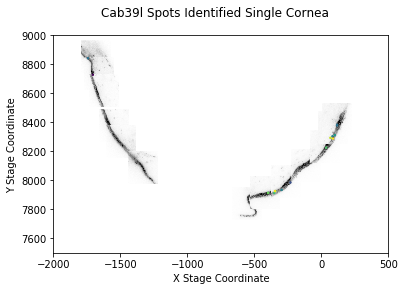

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

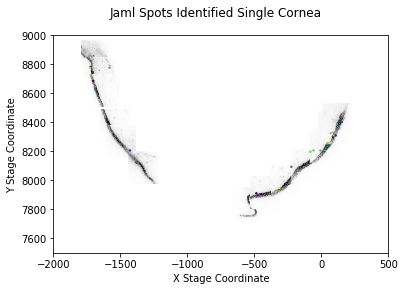

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

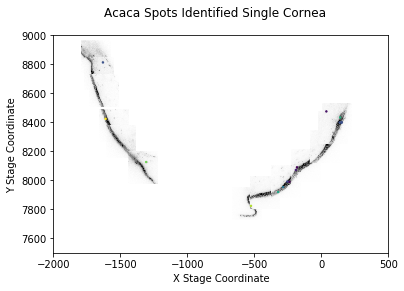

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

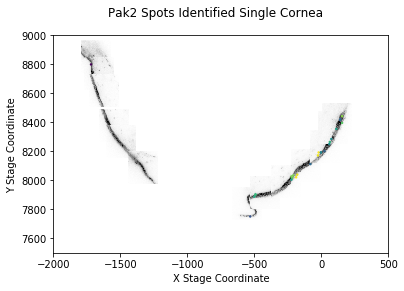

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

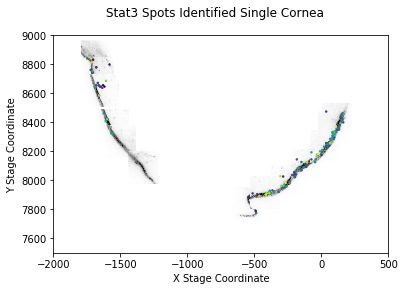

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

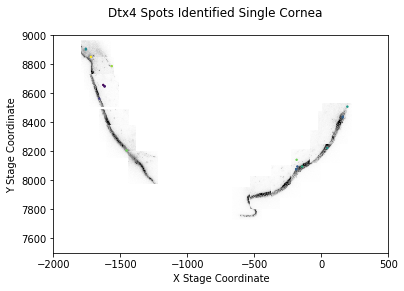

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

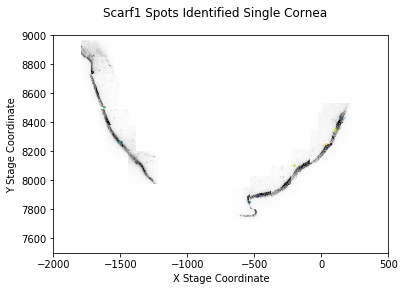

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

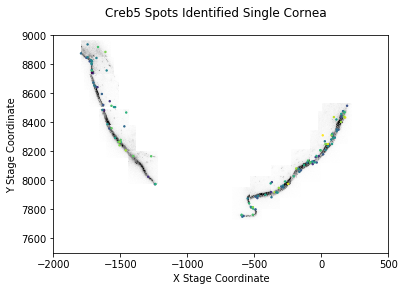

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

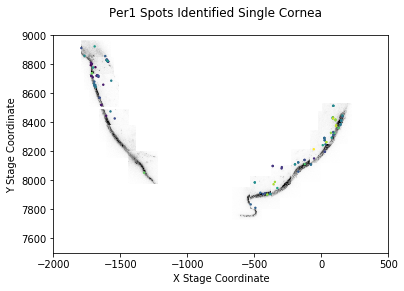

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

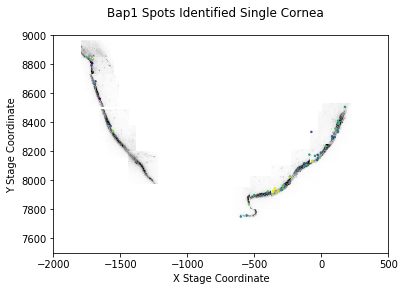

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

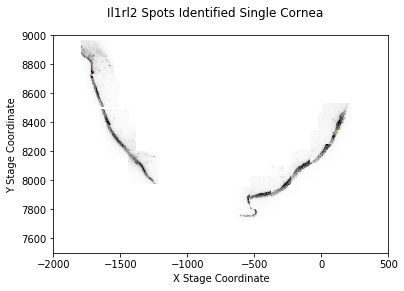

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

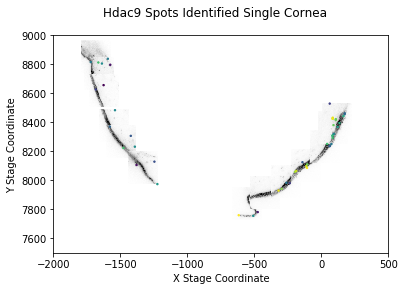

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

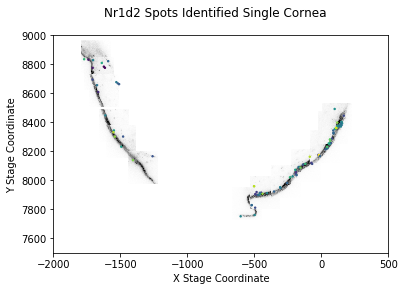

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

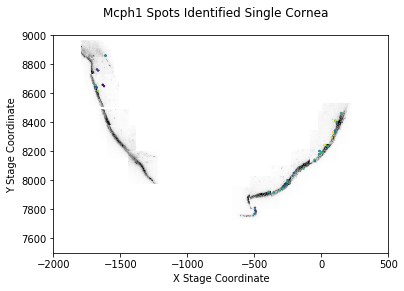

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

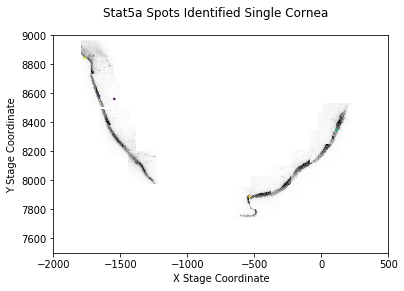

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

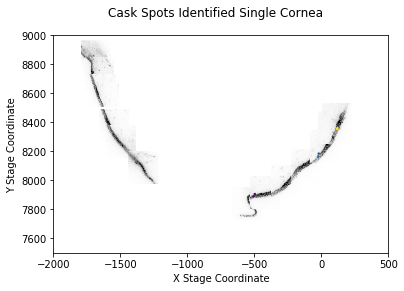

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

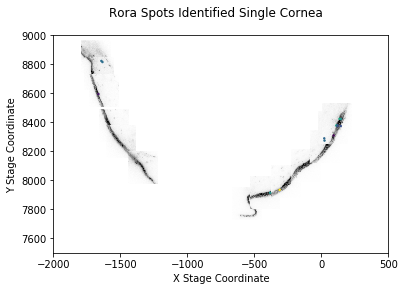

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

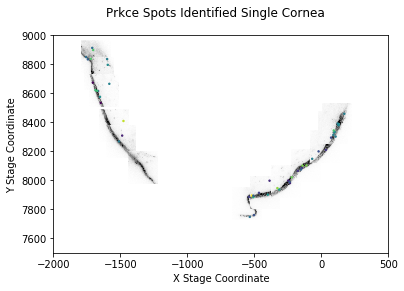

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

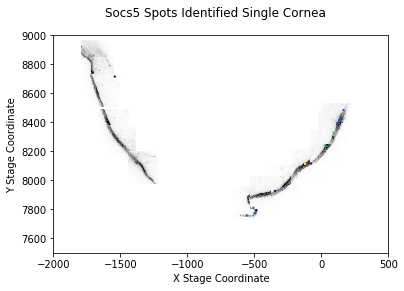

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

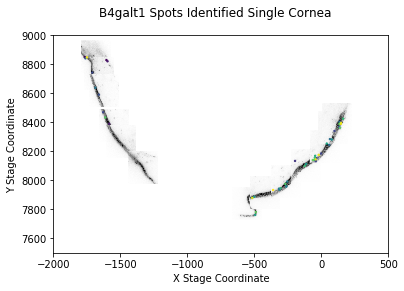

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

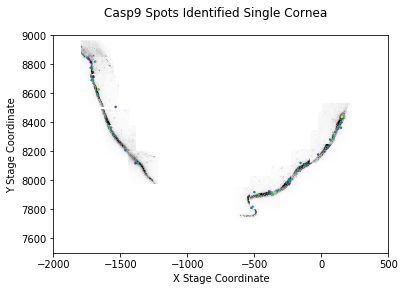

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

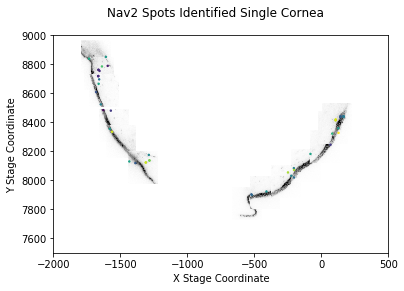

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

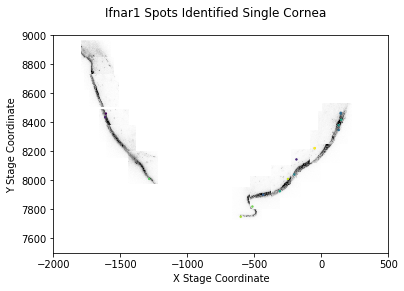

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

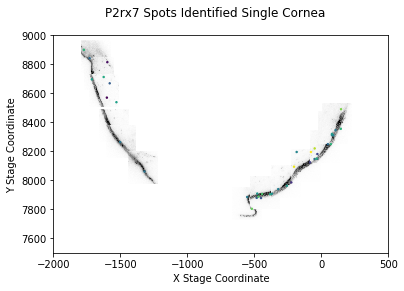

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

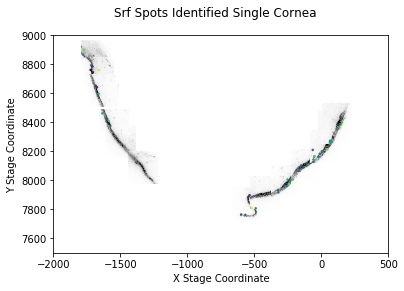

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

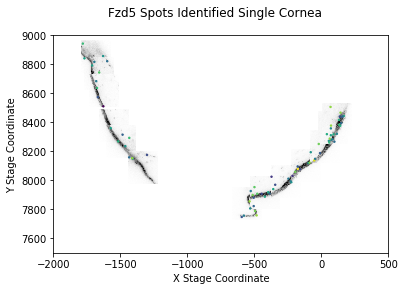

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

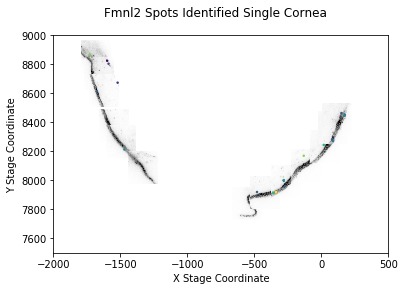

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

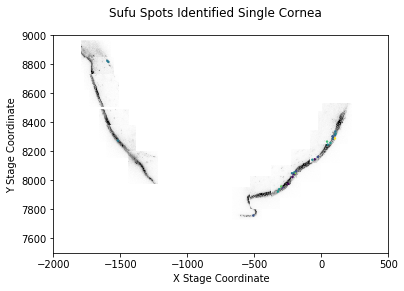

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

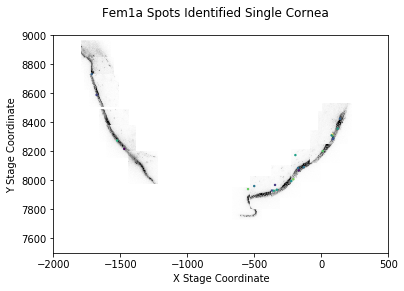

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

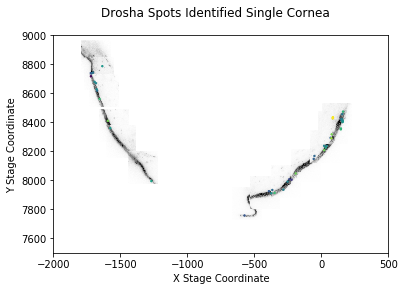

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

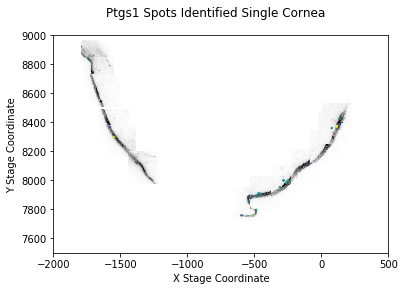

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

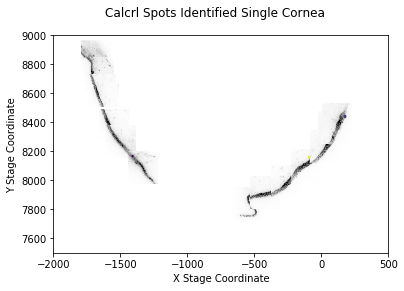

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

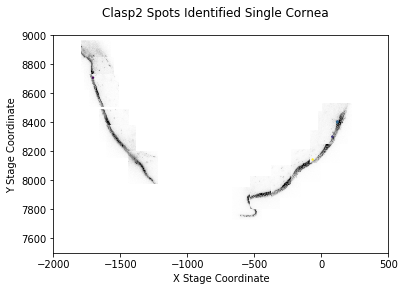

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

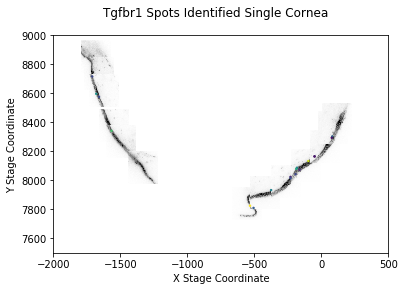

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

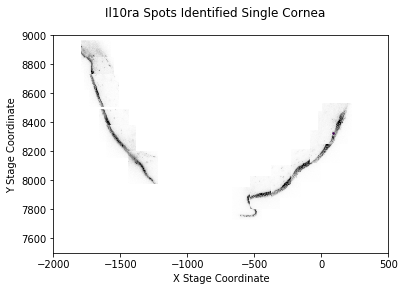

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

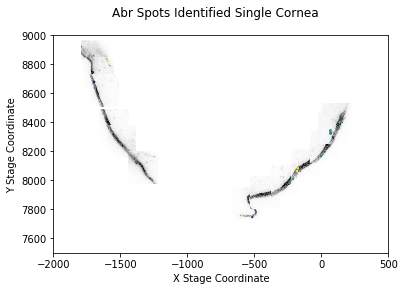

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

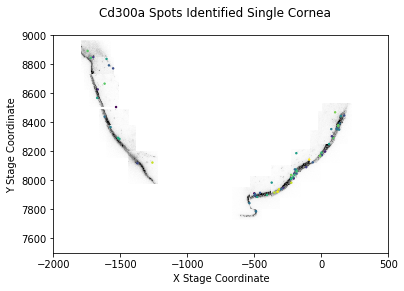

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

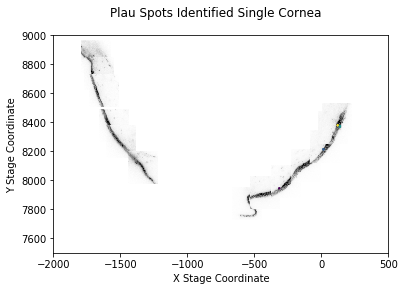

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

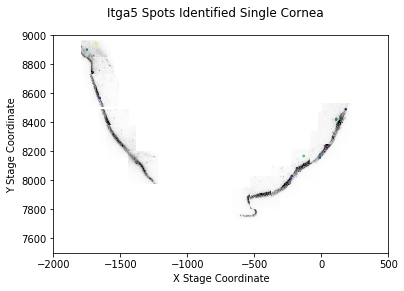

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

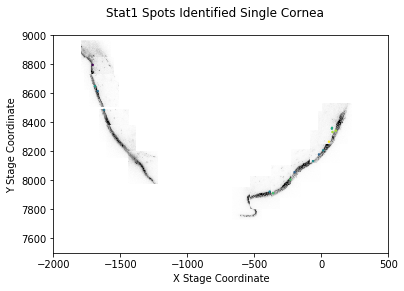

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

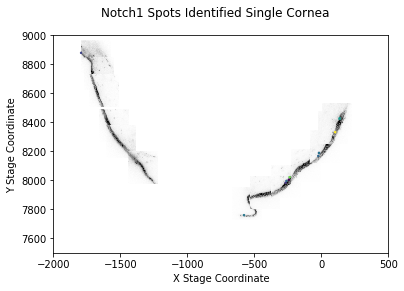

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

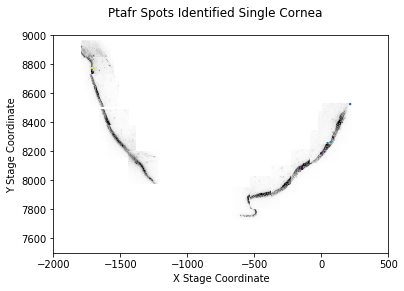

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

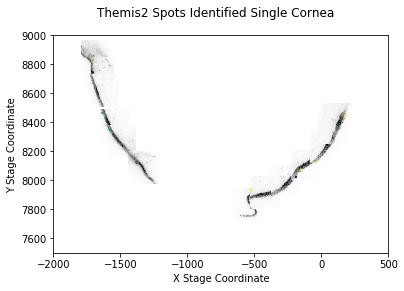

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

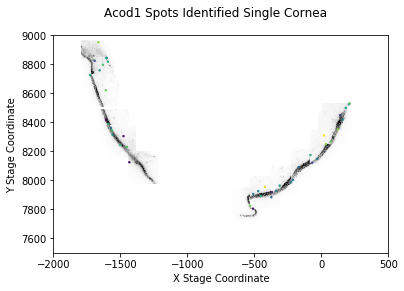

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

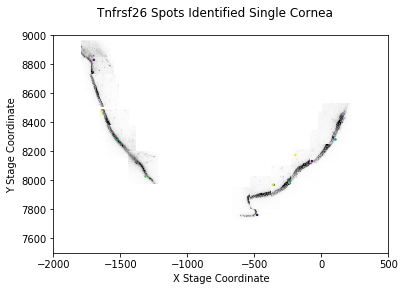

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

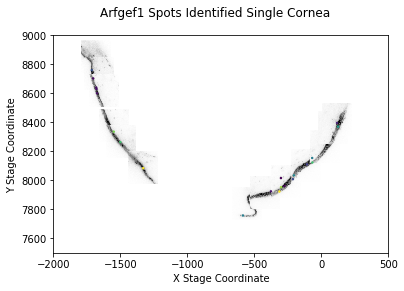

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

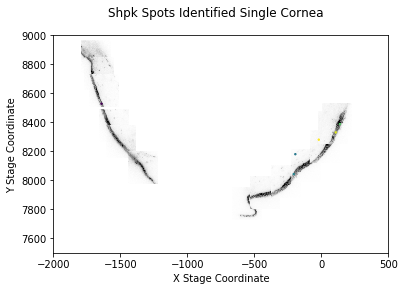

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

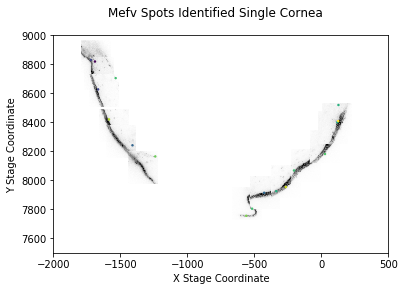

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

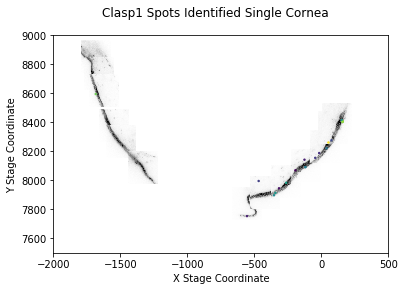

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

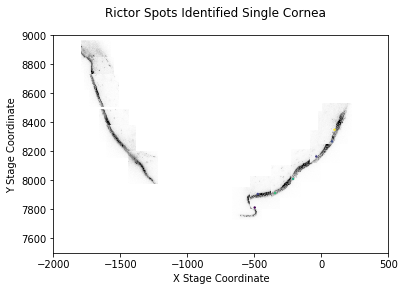

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

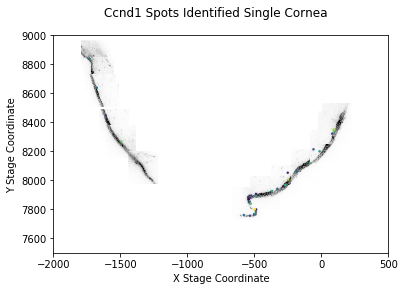

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

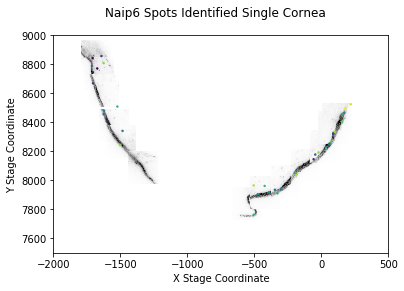

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

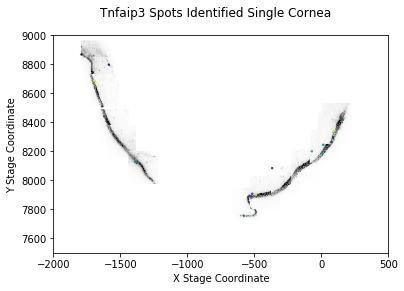

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

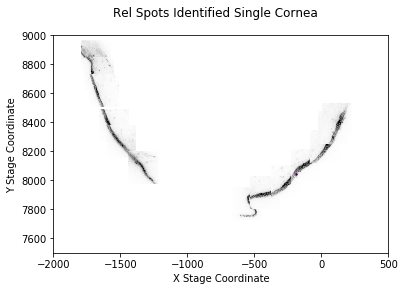

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

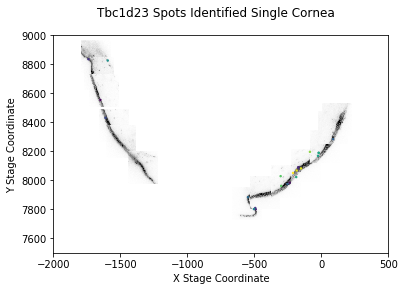

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

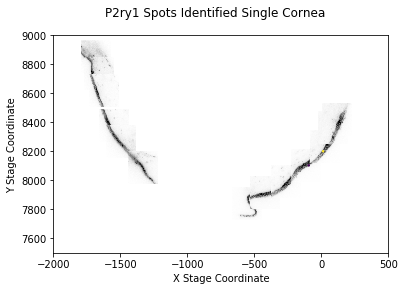

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

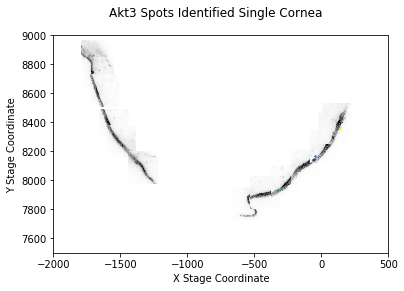

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

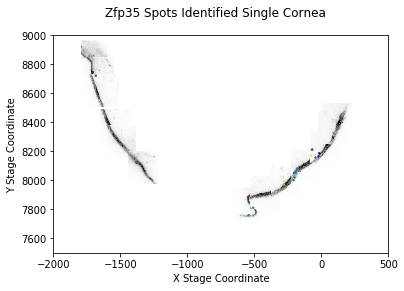

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

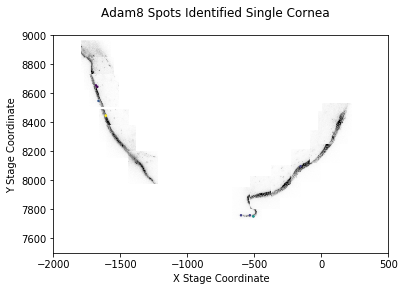

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

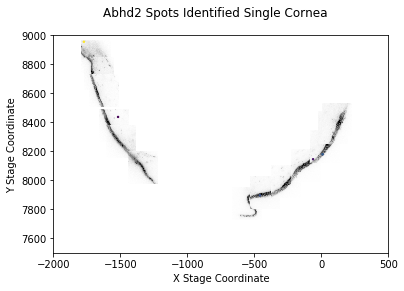

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

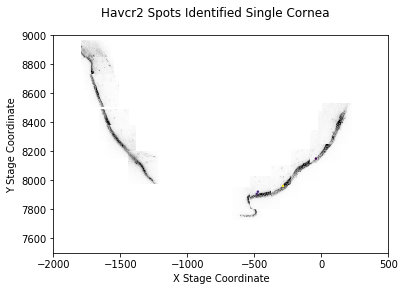

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

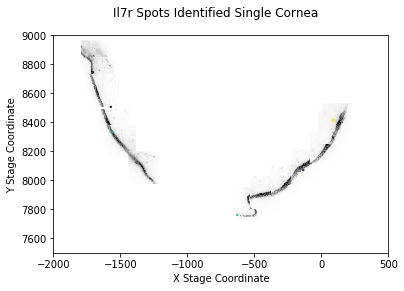

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

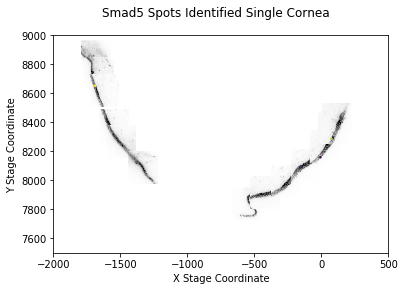

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

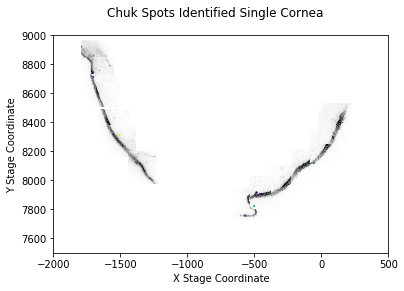

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

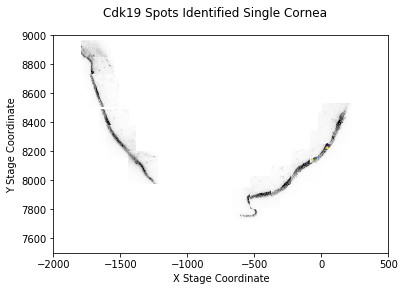

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

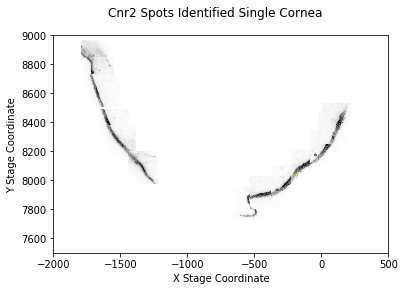

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

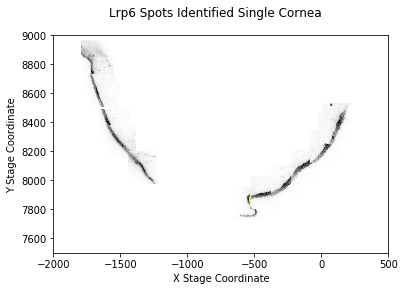

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

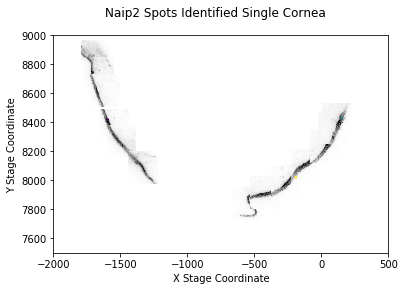

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

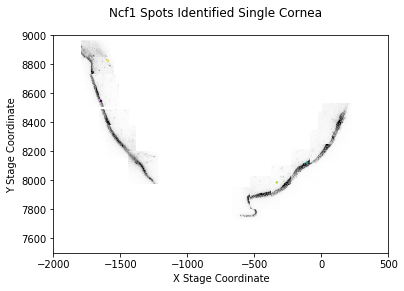

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

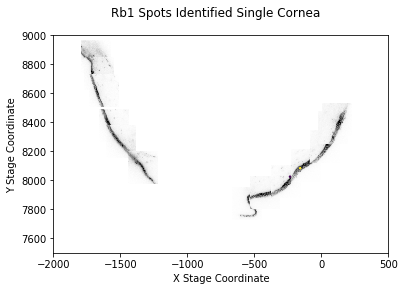

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

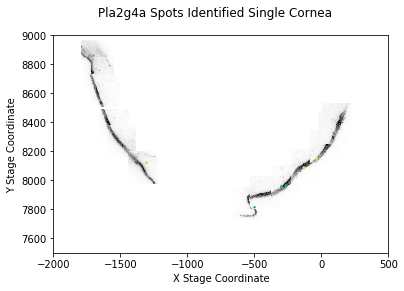

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

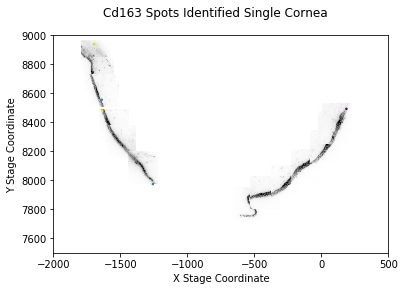

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

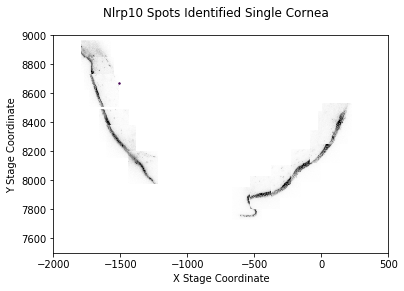

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

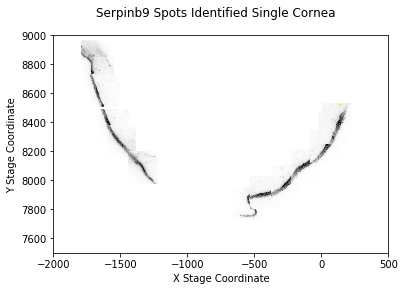

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

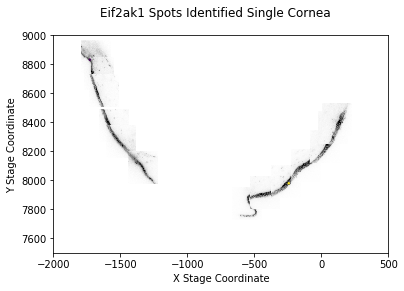

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

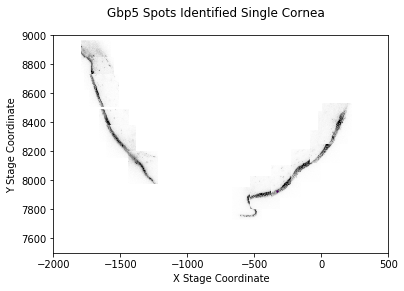

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

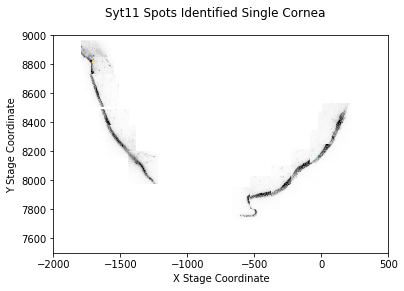

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

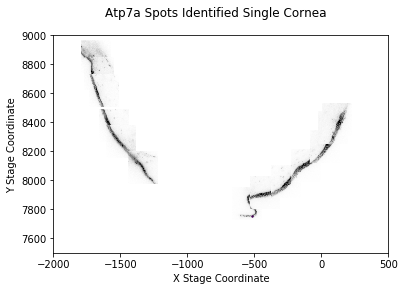

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

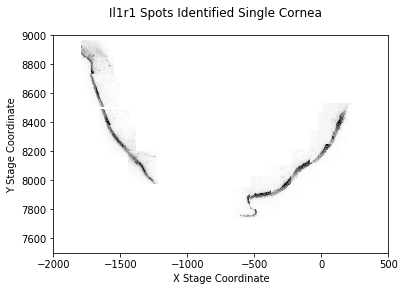

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

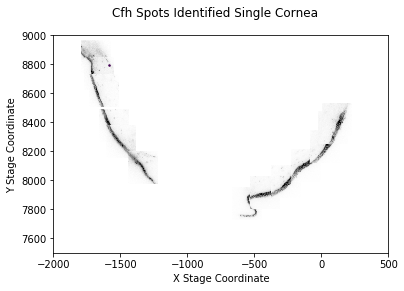

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

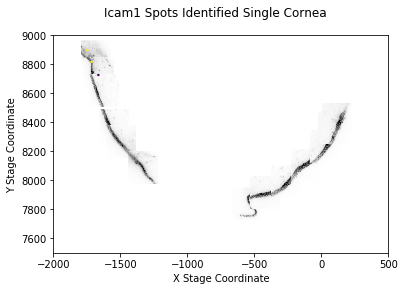

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

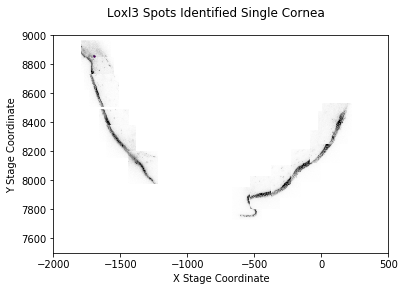

opening img_Pos43_000000025_000000000_DeepBlue_000_025.tif

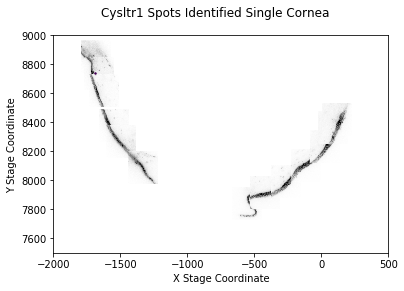

In [27]:
%matplotlib inline
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox
cornea1_df = df[df.coordX<1000]
cornea1_df = cornea1_df[cornea1_df.coordY<9000]
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
for gene in cornea1_df.gene.unique():
    fig = plt.figure()
    ax = fig.add_subplot(111)
    artists = []
    for pos in np.unique(cornea1_df.Position):
        x = cornea1_df[cornea1_df.Position==pos].coordX.iloc[0]
        y = cornea1_df[cornea1_df.Position==pos].coordY.iloc[0]
        im = np.rot90(md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_1',Zindex=25)[:,:,0],2)
        bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
        bb2 = TransformedBbox(bb,ax.transData)
        bbox_image = BboxImage(bb2,
                            norm = None,
                            origin=None,
                            clip_on=False,
                            cmap='Greys')
        bbox_image.set_data(im)
        ax.add_artist(bbox_image)

    pixelsize = 0.109
    cameradirection = [-1,1]
    temp_df = cornea1_df[cornea1_df.gene==gene]
    X = []
    Y = []
    Z = []
    for i in range(len(temp_df.centroid)):
        rx = temp_df.centroid.iloc[i][1]-2048
        ry = temp_df.centroid.iloc[i][0]#-2048
        x = rx*pixelsize*cameradirection[0]+temp_df.coordX.iloc[i]
        y = ry*pixelsize*cameradirection[1]+temp_df.coordY.iloc[i]
        X.append(x)
        Y.append(y)
        Z.append(temp_df.coordZ.iloc[i])
    plt.scatter(X,Y,c=Z,s=2)
    plt.xlabel('X Stage Coordinate')
    plt.ylabel('Y Stage Coordinate')
    plt.suptitle(str(gene)+' Spots Identified Single Cornea')

    ax.set_xlim(-2000,500)
    ax.set_ylim(7500,9000)
    plt.show()

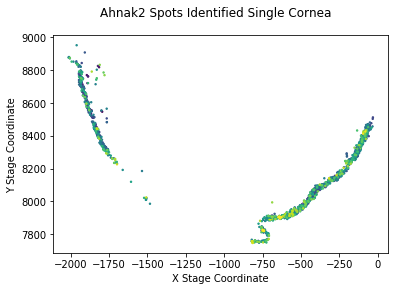

In [29]:
%matplotlib inline
pixelsize = 0.109
cameradirection = [-1,1]
gene = 'Ahnak2'
cornea1_df = df[df.coordX<1000]
cornea1_df = cornea1_df[cornea1_df.coordY<9000]
temp_df = cornea1_df[cornea1_df.gene==gene]
X = []
Y = []
Z = []
for i in range(len(temp_df.centroid)):
    rx = temp_df.centroid.iloc[i][1]
    ry = temp_df.centroid.iloc[i][0]
    x = rx*pixelsize*cameradirection[0]+temp_df.coordX.iloc[i]
    y = ry*pixelsize*cameradirection[1]+temp_df.coordY.iloc[i]
    X.append(x)
    Y.append(y)
    Z.append(temp_df.coordZ.iloc[i])
plt.scatter(X,Y,c=Z,s=2)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle(str(gene)+' Spots Identified Single Cornea')

plt.show()

<IPython.core.display.Javascript object>


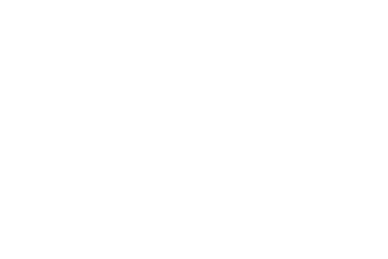

Text(0.5,0.98,'RNA Spots Identified Single Cornea')

<IPython.core.display.Javascript object>


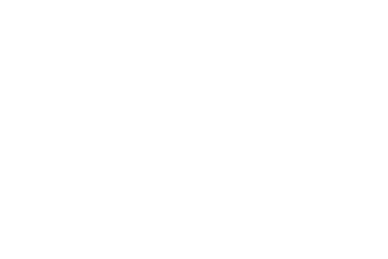

In [59]:
%matplotlib notebook
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
cornea1_df = df_all[df_all.coordX>3000]
cornea1_df = cornea1_df[cornea1_df.coordY>10000]

fig = plt.figure()
ax = Axes3D(fig)
pixelsize = 0.1
cameradirection = [-1,1]
# for gene in cornea1_df.gene:
temp_df = cornea1_df#[cornea1_df.gene=='Tnfrsf21']
X = []
Y = []
Z = []
for i in range(len(temp_df.centroid)):
    rx = temp_df.centroid.iloc[i][1]-2048/2
    ry = temp_df.centroid.iloc[i][0]-2048/2
    x = rx*pixelsize*cameradirection[0]+temp_df.coordX.iloc[i]
    y = ry*pixelsize*cameradirection[1]+temp_df.coordY.iloc[i]
    X.append(x)
    Y.append(y)
    Z.append(temp_df.coordZ.iloc[i])
cset = ax.scatter(X,Y,Z)
ax.set_xlabel('X Stage Coordinate')
ax.set_ylabel('Y Stage Coordinate')
ax.set_zlabel('Z Stage Coordinate')
ax.clabel(cset, fontsize=9, inline=1)
ax.grid(False)
#plt.axis('off')
plt.show()
plt.suptitle('RNA Spots Identified Single Cornea')

<IPython.core.display.Javascript object>


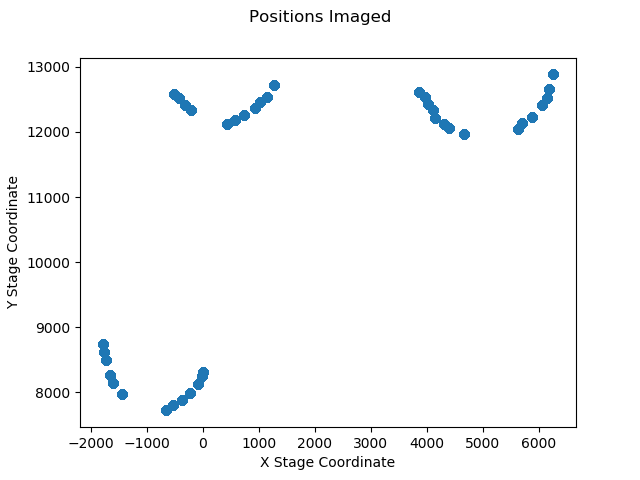

Text(0,0.5,'Y Stage Coordinate')

In [8]:
%matplotlib notebook
import matplotlib.pyplot as plt
trimmed_df = df_all[df_all.ave>400]
X = trimmed_df.coordX
Y = trimmed_df.coordY
plt.scatter(X,Y)
plt.suptitle('Positions Imaged')
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')

<IPython.core.display.Javascript object>


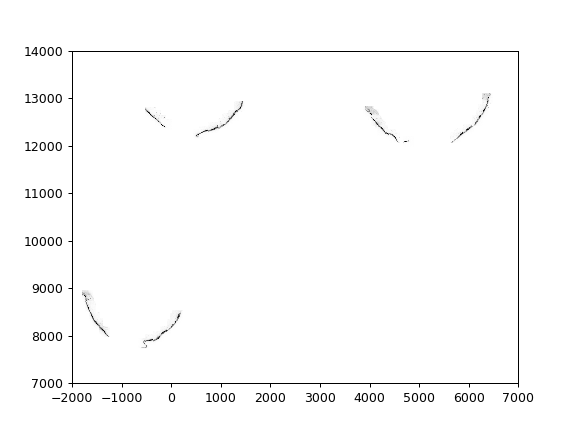

opening img_Pos9_000000025_000000000_DeepBlue_000_025.tiff

In [50]:
%matplotlib notebook
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox

img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
fig = plt.figure()
ax = fig.add_subplot(111)
artists = []
for pos in np.unique(df_all.Position):
    x = df_all[df_all.Position==pos].coordX.iloc[0]
    y = df_all[df_all.Position==pos].coordY.iloc[0]
    im = np.rot90(md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_1',Zindex=25)[:,:,0],2)
    bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
    bb2 = TransformedBbox(bb,ax.transData)
    bbox_image = BboxImage(bb2,
                        norm = None,
                        origin=None,
                        clip_on=False,
                        cmap='Greys')
    bbox_image.set_data(im)
    ax.add_artist(bbox_image)
ax.set_xlim(-2000,7000)
ax.set_ylim(7000,14000)
plt.show()

<IPython.core.display.Javascript object>


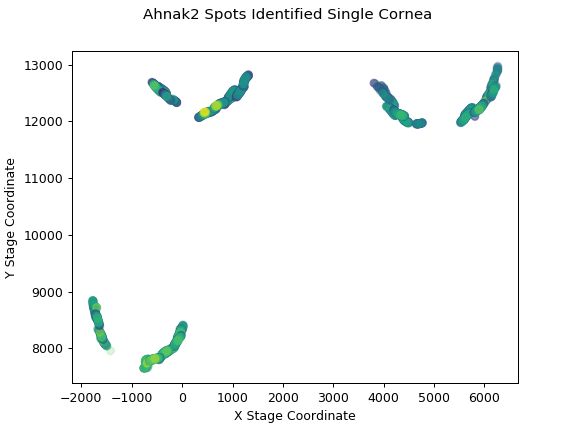

In [48]:
%matplotlib notebook
pixelsize = 0.109
cameradirection = [-1,1]
gene = 'Ahnak2'
temp_df = df_all[df_all.gene==gene]
X = []
Y = []
Z = []
for i in range(len(temp_df.centroid)):
    rx = temp_df.centroid.iloc[i][1]
    ry = temp_df.centroid.iloc[i][0]
    x = rx*pixelsize*cameradirection[0]+temp_df.coordX.iloc[i]
    y = ry*pixelsize*cameradirection[1]+temp_df.coordY.iloc[i]
    X.append(x)
    Y.append(y)
    Z.append(temp_df.coordZ.iloc[i])
plt.scatter(X,Y,c=Z,alpha=0.2)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle(str(gene)+' Spots Identified Single Cornea')

plt.show()

opening img_Pos9_000000025_000000000_DeepBlue_000_025.tiff

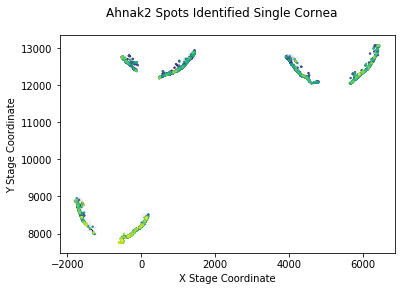

In [24]:
%matplotlib inline
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox
cornea1_df = df
img_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(img_path)
fig = plt.figure()
ax = fig.add_subplot(111)
artists = []
for pos in np.unique(cornea1_df.Position):
    x = cornea1_df[cornea1_df.Position==pos].coordX.iloc[0]
    y = cornea1_df[cornea1_df.Position==pos].coordY.iloc[0]
    im = np.rot90(md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_1',Zindex=25)[:,:,0],2)
    bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
    bb2 = TransformedBbox(bb,ax.transData)
    bbox_image = BboxImage(bb2,
                        norm = None,
                        origin=None,
                        clip_on=False,
                        cmap='Greys')
    bbox_image.set_data(im)
    ax.add_artist(bbox_image)

pixelsize = 0.109
cameradirection = [-1,1]
gene = 'Ahnak2'
temp_df = cornea1_df[cornea1_df.gene==gene]
X = []
Y = []
Z = []
for i in range(len(temp_df.centroid)):
    rx = temp_df.centroid.iloc[i][1]-2048
    ry = temp_df.centroid.iloc[i][0]#-2048
    x = rx*pixelsize*cameradirection[0]+temp_df.coordX.iloc[i]
    y = ry*pixelsize*cameradirection[1]+temp_df.coordY.iloc[i]
    X.append(x)
    Y.append(y)
    Z.append(temp_df.coordZ.iloc[i])
plt.scatter(X,Y,c=Z,s=2)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle(str(gene)+' Spots Identified Single Cornea')
plt.show()

opening img_TL_site2_1_2_000000001_000000000_Brightfield_000_001.tif

/home/zach/Documents/PyImages/metadata.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  image_subset_table.sort_values(sortby, inplace=True)


opening img_TL_site64_8_8_000000001_000000000_Brightfield_000_001.tif

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


<IPython.core.display.Javascript object>


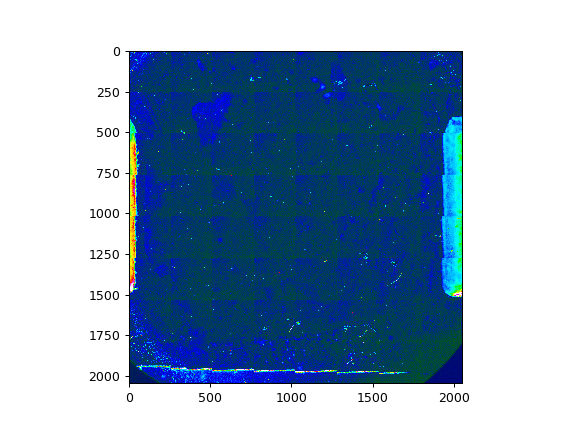

In [53]:
import itertools as it
md_bright = Metadata('/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17')
bf, bf_md = md_bright.stkread(Channel='Brightfield', groupby='acq', metadata=True, fnames_only=False)

acq = 'acq_2'
xy = bf_md[acq].XY.values
xy = list(map(tuple, xy))
sorted_xy = sorted(xy, key=lambda x: x[1], reverse=True)
sorted_xy = sorted(sorted_xy, key=lambda x: x[0])
sorted_xy = np.array(sorted_xy[::-1])
sort_map = {}
for idx, pos in enumerate(xy):
   ix = [i for i, v in enumerate(map(tuple, sorted_xy)) if v == pos]
   sort_map[idx] = ix[0]

nx = len(set(sorted_xy[:, 0]))
ny = len(set(sorted_xy[:, 1]))
stitched_image = np.empty((2048*ny, 2048*nx))
for idx, (x, y) in enumerate(it.product(range(nx), range(ny))):
   img_ix = sort_map[idx]
   img = bf[acq][:,:,img_ix]
#     plt.imshow(img)
#     plt.show()
   stitched_image[y*2048:y*2048+2048, x*2048:x*2048+2048] = img
   #print(bf_md[acq].iloc[img_ix].Position, x, y)
   #print(sorted_xy[idx], x)

obj4x_XY_range_um = (2593, 2593)
minX = sorted_xy[:, 0].min()-obj4x_XY_range_um[0]/2
minY = sorted_xy[:, 1].min()-obj4x_XY_range_um[0]/2
maxX = sorted_xy[:, 0].max()+obj4x_XY_range_um[0]/2
maxY = sorted_xy[:, 1].max()+obj4x_XY_range_um[0]/2

stitched_stage_coordsX = np.linspace(minX, maxX, stitched_image.shape[1])
stitched_stage_coordsY = np.linspace(minY, maxY, stitched_image.shape[0])
%matplotlib notebook
plt.imshow(resize(stitched_image,[2048,2048]),cmap='gist_ncar')

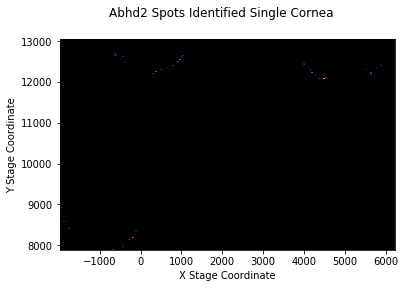

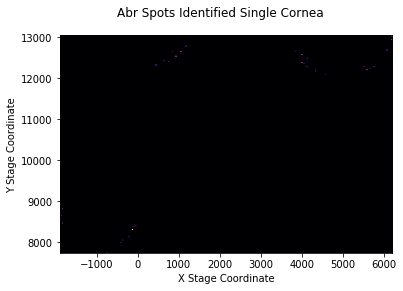

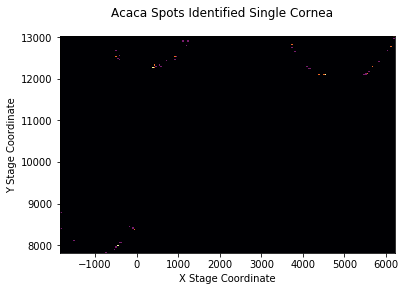

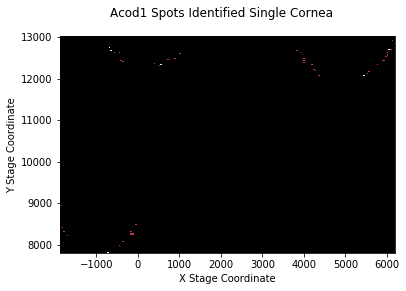

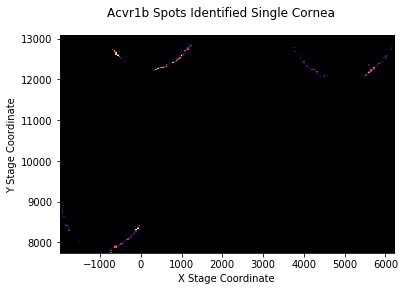

...

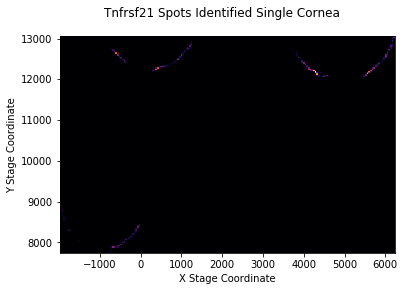

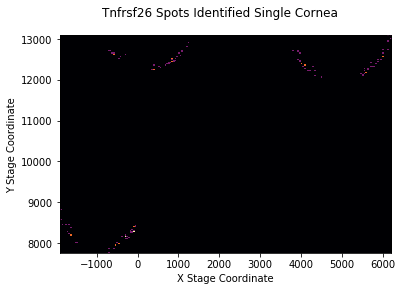

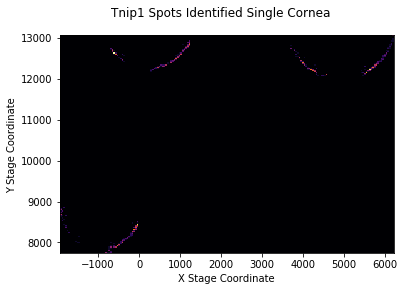

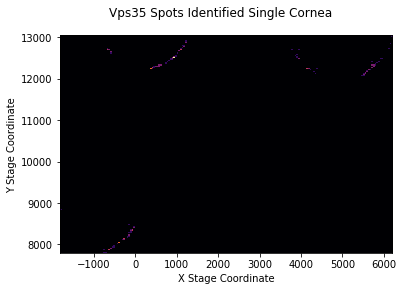

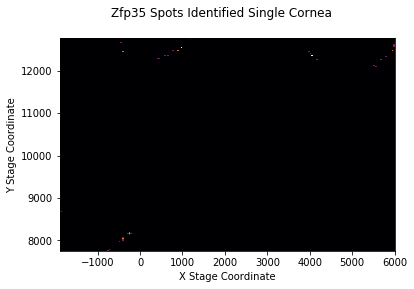

In [26]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
cornea1_df = df
pixelsize = 0.1
cameradirection = [1,-1]
for gene in np.unique(cornea1_df.gene):
    if len(cornea1_df[cornea1_df.gene==gene])>20:
        temp_df = cornea1_df[cornea1_df.gene==gene]
        X = []
        Y = []
        Z = []
        for i in range(len(temp_df.centroid)):
            rx = temp_df.centroid.iloc[i][1]
            ry = temp_df.centroid.iloc[i][0]
            x = rx*pixelsize*cameradirection[1]+temp_df.coordX.iloc[i]
            y = ry*pixelsize*cameradirection[0]+temp_df.coordY.iloc[i]
            X.append(x)
            Y.append(y)
            Z.append(temp_df.coordZ.iloc[i])
        heatmap, xedges, yedges = np.histogram2d(X, Y, bins=200)
        extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
        plt.clf()
        plt.imshow(heatmap.T, extent=extent, origin='lower',cmap='inferno')
        #plt.scatter(X,Y,c=Z,alpha=0.2)
        plt.xlabel('X Stage Coordinate')
        plt.ylabel('Y Stage Coordinate')
        plt.suptitle(str(gene)+' Spots Identified Single Cornea')
        plt.show()


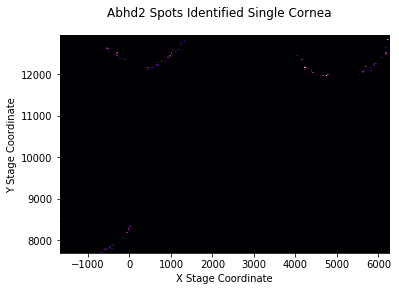

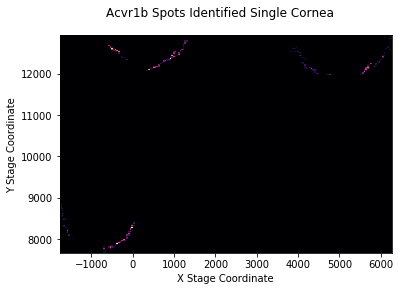

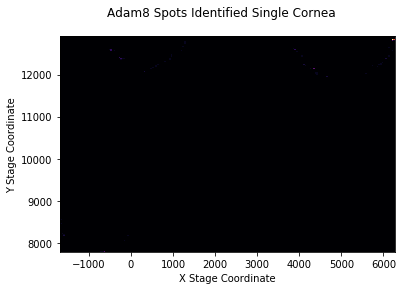

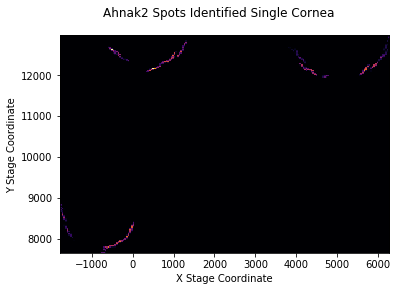

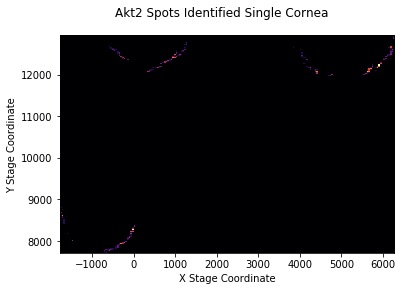

...

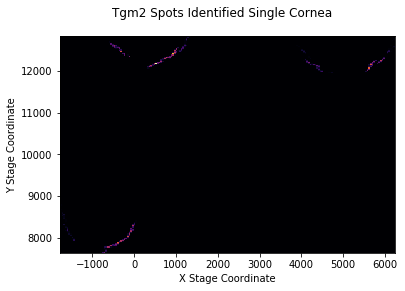

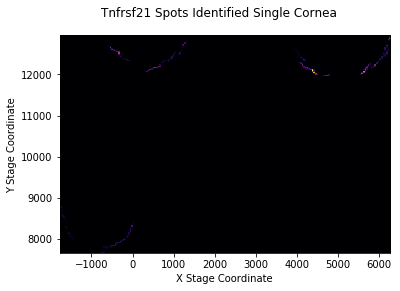

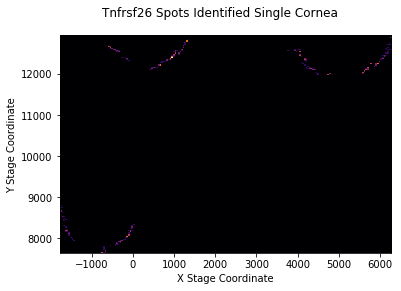

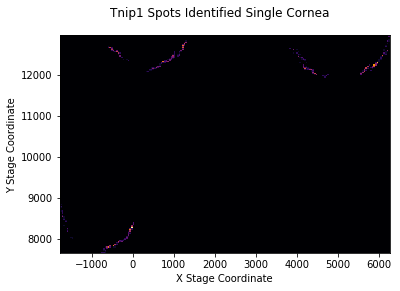

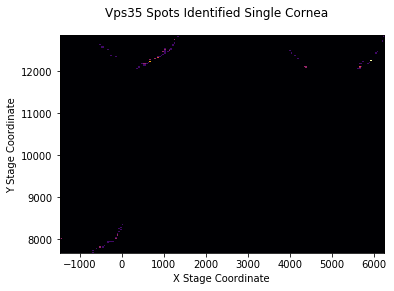

In [70]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
pixelsize = 0.1
cameradirection = [-1,1]
for gene in np.unique(df_all.gene):
    if len(df_all[df_all.gene==gene])>100:
        temp_df = df_all[df_all.gene==gene]
        X = []
        Y = []
        Z = []
        for i in range(len(temp_df.centroid)):
            rx = temp_df.centroid.iloc[i][1]-2048/2
            ry = temp_df.centroid.iloc[i][0]-2048/2
            x = rx*pixelsize*cameradirection[1]+temp_df.coordX.iloc[i]
            y = ry*pixelsize*cameradirection[0]+temp_df.coordY.iloc[i]
            X.append(x)
            Y.append(y)
            Z.append(temp_df.coordZ.iloc[i])
        heatmap, xedges, yedges = np.histogram2d(X, Y, bins=200)
        extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
        plt.clf()
        plt.imshow(heatmap.T, extent=extent, origin='lower',cmap='inferno')
        #plt.scatter(X,Y,c=Z,alpha=0.2)
        plt.xlabel('X Stage Coordinate')
        plt.ylabel('Y Stage Coordinate')
        plt.suptitle(str(gene)+' Spots Identified Single Cornea')
        plt.show()


In [71]:
cornea1_df = df_all[df_all.coordX<1000]
cornea1_df = cornea1_df[cornea1_df.coordY<9000]
cornea1_df

,gene,centroid,pixel_values,ave,npixels,cword_idx,coords,z,Position,coordX,coordY,coordZ
13744,Ahnak2,"(304.0, 1204.5)","{2: [670.86181640625, 486.2740173339844, 550.8...",569.543980,2,6,"[[304, 1204], [304, 1205]]",10,Pos30,-1774.0,8626.0,3094.422
13745,Gja1,"(423.0, 1379.0)","{0: [289.568603515625, 324.5824890136719, 419....",362.751732,1,59,"[[423, 1379]]",10,Pos30,-1774.0,8626.0,3094.422
13746,Bcl2l1,"(700.5, 1428.0)","{2: [433.17730712890625, 534.3878173828125, 43...",621.062027,2,17,"[[700, 1428], [701, 1428]]",10,Pos30,-1774.0,8626.0,3094.422
13747,Ahnak2,"(886.0, 1522.0)","{2: [1042.261962890625, 334.9419860839844, 504...",969.583481,1,6,"[[886, 1522]]",10,Pos30,-1774.0,8626.0,3094.422
13748,Sbno2,"(1007.8, 1513.6)","{11: [493.04632568359375, 770.3095703125, 1360...",952.766794,5,136,"[[1007, 1513], [1007, 1514], [1008, 1513], [10...",10,Pos30,-1774.0,8626.0,3094.422
13749,Kdm6b,"(1021.6, 1546.8)","{1: [702.5645751953125, 549.36865234375, 832.8...",772.086700,5,79,"[[1021, 1546], [1021, 1547], [1022, 1546], [10...",10,Pos30,-1774.0,8626.0,3094.422
13750,Dtx3l,"(1046.6, 1564.2)","{1: [2463.028564453125, 823.5985107421875, 752...",1492.335379,5,45,"[[1046, 1564], [1046, 1565], [1047, 1563], [10...",10,Pos30,-1774.0,8626.0,3094.422
13751,Tnfrsf21,"(1067.7142857142858, 1556.0)","{6: [700.54638671875, 780.0777587890625, 635.8...",774.979850,7,166,"[[1067, 1555], [1067, 1556], [1067, 1557], [10...",10,Pos30,-1774.0,8626.0,3094.422
13752,Drosha,"(1105.0, 1563.0)","{0: [725.3628540039062, 1406.947509765625, 726...",915.953979,1,44,"[[1105, 1563]]",10,Pos30,-1774.0,8626.0,3094.422
13753,Scarf1,"(1162.0, 1414.0)","{0: [324.68060302734375, 373.7979431152344, 27...",335.567871,1,137,"[[1162, 1414]]",10,Pos30,-1774.0,8626.0,3094.422


In [23]:
import pandas as pd
RNA_Expression = pd.read_csv('/home/zach/Downloads/Cornea Wound Gene List - Inflammation Final.csv')
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')


In [74]:
import importlib
import numpy as np
import pandas as pd
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
gvectors = seqfish_config.gene_codeword_vectors
genes = seqfish_config.gids
columns = np.array([])
for i in range(len(seqfish_config.bitmap)):
    columns = np.append(columns,seqfish_config.bitmap[i][0])
Genebook = pd.DataFrame(gvectors)
Genebook.columns = columns
Genebook.index = genes
Genebook

,RS0095_cy5,RS0109_cy5,RS0175_cy5,RS0237_cy5,RS0307_cy5,RS0332_cy5,RS0384_atto565,RS0406_atto565,RS0451_atto565,RS0468_atto565,RS0548_atto565,RS64.0_atto565,RSN9927.0_cy5,RSN2336.0_cy5,RSN1807.0_cy5,RSN4287.0_atto565,RSN1252.0_atto565,RSN9535.0_atto565
Abhd2,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Abr,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
Acaca,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Acod1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Acvr1b,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Adam8,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
Ahnak2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
Akt2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
Akt3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
Aoah,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0


In [90]:
fpkm = GeneList.FPKM
for readout in Genebook.columns:
    bits = np.array(Genebook[readout])
    counts = bits*fpkm
    print(int(counts.sum()),' total fpkm for readout ',readout)

518  total fpkm for readout  RS0095_cy5
552  total fpkm for readout  RS0109_cy5
794  total fpkm for readout  RS0175_cy5
480  total fpkm for readout  RS0237_cy5
523  total fpkm for readout  RS0307_cy5
569  total fpkm for readout  RS0332_cy5
434  total fpkm for readout  RS0384_atto565
666  total fpkm for readout  RS0406_atto565
422  total fpkm for readout  RS0451_atto565
468  total fpkm for readout  RS0468_atto565
960  total fpkm for readout  RS0548_atto565
689  total fpkm for readout  RS64.0_atto565
552  total fpkm for readout  RSN9927.0_cy5
341  total fpkm for readout  RSN2336.0_cy5
629  total fpkm for readout  RSN1807.0_cy5
526  total fpkm for readout  RSN4287.0_atto565
403  total fpkm for readout  RSN1252.0_atto565
709  total fpkm for readout  RSN9535.0_atto565


In [ ]:
import pickle
spotcalls = pickle.load(open('/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/codestacks/spotcalls.pkl','rb'))

In [ ]:
spotcalls.columns

In [ ]:
spotcalls = spotcalls.drop(columns = 'pixel_list')
spotcalls = spotcalls.drop(columns = 'coord')

In [17]:
def purge_zoverlap(z_i,df,zidxes):
    save_path = '/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_First_2018Nov23-Corrected/codestacks/overlap'
    print(z_i)
    subdf = df[(df.z==zidxes[z_i]) | (df.z==zidxes[z_i+1])]
    yx = subdf.centroid.values
    yx = np.stack(yx, axis=0)
    tree = KDTree(yx)
    dclust = DBSCAN(eps=2, min_samples=2)
    dclust.fit(yx)
    skip_list = set(np.where(dclust.labels_==-1)[0])
    nomatches = []
    drop_list = []
    for idx, i in enumerate(yx):
#         if idx % 10000 == 0:
#             print(idx)
        if idx in skip_list:
            continue
        m = tree.query_ball_point(i, 2)
        m = [j for j in m if j!=idx]

        row_query = subdf.iloc[idx]
        for j in m:
            row_match = subdf.iloc[j]
            if row_match.cword_idx!=row_query.cword_idx:
                continue

            if row_match.npixels>=row_query.npixels:
                drop_list.append((idx, j))
            else:
                drop_list.append((j, idx))
                break
    if len(drop_list)>0:
        os.makedirs(os.path.join(save_path,str(z_i)))
        pickle.dump(drop_list,open(os.path.join(save_path,'drop_list.pkl'),'wb'))
#         droppers, keepers = zip(*drop_list)
#         return droppers, keepers,z_i
        #df.drop(index=subdf.iloc[list(droppers)].index,inplace=True)

In [18]:
df = spotcalls.copy()
zidxes = df.z.unique()
drop_list = {}
keep_list = {}

In [19]:
import multiprocessing
from functools import partial
import os
import numpy as np
from sklearn.cluster import DBSCAN
from scipy.spatial import KDTree
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['GOTO_NUM_THREADS'] = '1'
os.environ['OMP_NUM_THREADS'] = '1'
with multiprocessing.Pool(32) as ppool:
    parse_pfunc = partial(purge_zoverlap,df=df,zidxes=zidxes)
    results = ppool.map(parse_pfunc, range(len(zidxes)-1))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46


In [ ]:
import numpy as np
from sklearn.cluster import DBSCAN
from scipy.spatial import KDTree
def purge_wrapper(df):
    zidxes = df.z.unique()
    for z_i in range(len(zidxes)-1):
        subdf = df[(df.z==zidxes[z_i]) | (df.z==zidxes[z_i+1])]
        yx = subdf.centroid.values
        yx = np.stack(yx, axis=0)
        tree = KDTree(yx)
        dclust = DBSCAN(eps=2, min_samples=2)
        dclust.fit(yx)
        skip_list = set(np.where(dclust.labels_==-1)[0])
        nomatches = []
        drop_list = []
        for idx, i in enumerate(yx):
            if idx % 10000 == 0:
                print(idx)
            if idx in skip_list:
                continue
            m = tree.query_ball_point(i, 2)
            m = [j for j in m if j!=idx]

            row_query = subdf.iloc[idx]
            for j in m:
                row_match = subdf.iloc[j]
                if row_match.cword_idx!=row_query.cword_idx:
                    continue

                if row_match.npixels>=row_query.npixels:
                    drop_list.append((idx, j))
                else:
                    drop_list.append((j, idx))
                    break
        if len(drop_list)>0:
            droppers, keepers = zip(*drop_list)
            df.drop(index=subdf.iloc[list(droppers)].index,inplace=True)
    return df
DF = purge_zoverlap(minspotcalls)